# Data Science - Delivery #4

In [1]:
import numpy as np
import re
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.preprocessing import LabelEncoder

In [2]:
# Read Data
df = pd.read_csv('../data/training.1600000.processed.noemoticon.csv', header=None, encoding='latin')
df.columns = ['label', 'id', 'date', 'query', 'user', 'tweet']

# Data reduction
df = df.drop(['id', 'date', 'query', 'user'], axis=1)

In [3]:
labels_dict = {0:'Negative', 2:'Neutral', 4:'Positive'}

def convert_labels(label):
    return labels_dict[label]

df.label = df.label.apply(lambda x: convert_labels(x))
df

,label,tweet
0,Negative,"@switchfoot http://twitpic.com/2y1zl - Awww, t..."
1,Negative,is upset that he can't update his Facebook by ...
2,Negative,@Kenichan I dived many times for the ball. Man...
3,Negative,my whole body feels itchy and like its on fire
4,Negative,"@nationwideclass no, it's not behaving at all...."
...,...,...
1599995,Positive,Just woke up. Having no school is the best fee...
1599996,Positive,TheWDB.com - Very cool to hear old Walt interv...
1599997,Positive,Are you ready for your MoJo Makeover? Ask me f...
1599998,Positive,Happy 38th Birthday to my boo of alll time!!! ...


Text(0.5, 1.0, 'Data Distribution')

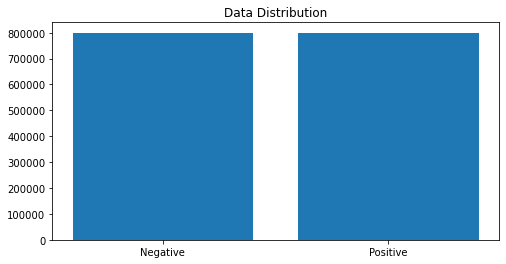

In [4]:
instances = df.label.value_counts()

plt.figure(figsize=(8,4))
plt.bar(instances.index, instances.values)
plt.title("Data Distribution")

## Preprocess

In [5]:
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords
from nltk.stem import SnowballStemmer

stop_words = stopwords.words('english')
stemmer = SnowballStemmer('english')

punctuations_and_dummies = "@\S+|https?:\S+|http?:\S|[^A-Za-z0-9]+"



'''
def preprocess(df, will_be_stemmed=False):
    for index, row in df.iterrows():
        tweet = row.tweet
        tweet = re.sub(punctuations_and_dummies, ' ', str(tweet).lower()).strip()
        tokens = []
        for token in tweet.split():
            if token not in stop_words:
                if will_be_stemmed:
                    tokens.append(stemmer.stem(token))
                else:
                    tokens.append(token)
        df.tweet = " ".join(tokens)


preprocess(df.tweet)
'''


def preprocess(tweet, will_be_stemmed=False):
        tweet = re.sub(punctuations_and_dummies, ' ', str(tweet).lower()).strip()
        tokens = []
        for token in tweet.split():
            if token not in stop_words:
                if will_be_stemmed:
                    tokens.append(stemmer.stem(token))
                else:
                    tokens.append(token)
        return " ".join(tokens)
    
df.tweet = df.tweet.apply(lambda tw: preprocess(tw))

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\ardab\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [6]:
# Remove 0 length tweets
df = df[df.iloc[:,1].astype(str).str.len()!=0]

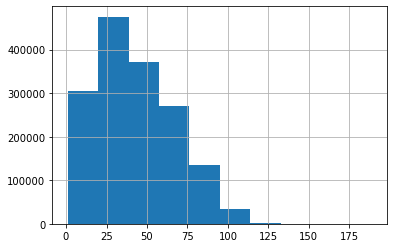

count    1.592328e+06
mean     4.279740e+01
std      2.415896e+01
min      1.000000e+00
25%      2.300000e+01
50%      3.900000e+01
75%      6.000000e+01
max      1.890000e+02
dtype: float64

In [7]:
tweets_len = [len(x) for x in df['tweet']]
pd.Series(tweets_len).hist()
plt.show()
pd.Series(tweets_len).describe()

### Number of Letters

In [8]:
all_str = ""
for i in df.tweet:
    all_str += i

In [9]:
from collections import Counter

letter_list = list(all_str)
my_counter = Counter(letter_list)

letter_df = pd.DataFrame.from_dict(my_counter, orient='index').reset_index()
letter_df = letter_df.rename(columns={'index':'letter', 0:'frequency'})
letter_df = letter_df.loc[letter_df['letter'].isin(['a','b','c','d','e','f','g','h','i','j','k','l','m','n','o','p','q','r','s','t','u','v','w','x','y','z'])]
letter_df['all_tweets_relative_freq']=letter_df['frequency']/letter_df['frequency'].sum()
letter_df = letter_df.sort_values('letter')

english = pd.read_csv('../data/letter_frequency_en_US.csv')
english['expected_relative_frequency'] = english['count']/english['count'].sum()
english = english.drop(['count'], axis=1)

letter_df = pd.merge(letter_df, english, on='letter')
letter_df['expected'] = np.round(letter_df['expected_relative_frequency']*letter_df['frequency'].sum(),0)
letter_df = letter_df.reset_index().drop(['index'], axis=1)
letter_df

,letter,frequency,all_tweets_relative_freq,expected_relative_frequency,expected
0,a,4547601,0.078816,0.081238,4687379.0
1,b,975326,0.016904,0.014893,859300.0
2,c,1705409,0.029557,0.027114,1564464.0
3,d,2289515,0.039680,0.043192,2492128.0
4,e,6471295,0.112156,0.120195,6935169.0
5,f,878849,0.015232,0.023039,1329304.0
6,g,2231747,0.038679,0.020257,1168838.0
7,h,2234047,0.038719,0.059215,3416628.0
8,i,3779579,0.065505,0.073054,4215160.0
9,j,143817,0.002493,0.001031,59502.0


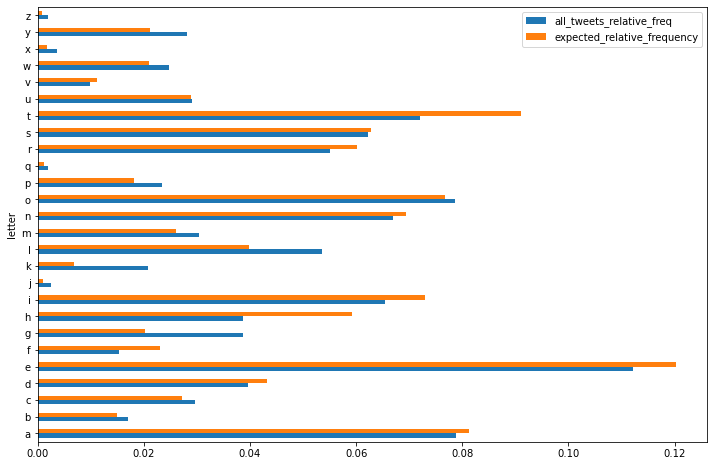

In [10]:
letter_df.plot(x="letter", y=["all_tweets_relative_freq", "expected_relative_frequency"], kind="barh", figsize=(12,8))

#### Compare the Observed Frequencies with the Expected Frequencies in English 

In [11]:
from scipy.stats import chi2_contingency
# Chi-square test of independence.
c, p, dof, expected = chi2_contingency(letter_df[['frequency', 'expected']])
p

0.0

We get that the p-value (p) is 0 which implies that the letter frequency does not follow the same distribution with what we see in English tests, although the Pearson correlation is too high (~96.7%).

In [12]:
letter_df[['frequency', 'expected']].corr()

,frequency,expected
frequency,1.000000,0.967421
expected,0.967421,1.000000


In [13]:
df1 = df.copy()

df1['number_of_characters'] = [len(tw) for tw in df1.tweet]
df1

,label,tweet,number_of_characters
0,Negative,awww bummer shoulda got david carr third day,44
1,Negative,upset update facebook texting might cry result...,69
2,Negative,dived many times ball managed save 50 rest go ...,52
3,Negative,whole body feels itchy like fire,32
4,Negative,behaving mad see,16
...,...,...,...
1599995,Positive,woke school best feeling ever,29
1599996,Positive,thewdb com cool hear old walt interviews,40
1599997,Positive,ready mojo makeover ask details,31
1599998,Positive,happy 38th birthday boo alll time tupac amaru ...,52


In [14]:
df1.number_of_characters.max()

189

In [15]:
df1.number_of_characters.min()

1

In [16]:
df1.number_of_characters.mean()

42.7974010379771

In [17]:
df1.number_of_characters.std()

24.15896165070398

## Number of Words

In [18]:
df1['number_of_words'] = [len(tw.split()) for tw in df1.tweet]
df1

,label,tweet,number_of_characters,number_of_words
0,Negative,awww bummer shoulda got david carr third day,44,8
1,Negative,upset update facebook texting might cry result...,69,11
2,Negative,dived many times ball managed save 50 rest go ...,52,10
3,Negative,whole body feels itchy like fire,32,6
4,Negative,behaving mad see,16,3
...,...,...,...,...
1599995,Positive,woke school best feeling ever,29,5
1599996,Positive,thewdb com cool hear old walt interviews,40,7
1599997,Positive,ready mojo makeover ask details,31,5
1599998,Positive,happy 38th birthday boo alll time tupac amaru ...,52,9


In [19]:
df1.number_of_words.max()

50

In [20]:
df1.number_of_words.min()

1

In [21]:
df1.number_of_words.mean()

7.244474128445898

In [22]:
df1.number_of_words.std()

4.030421805717334

### Positives + Negatives

<BarContainer object of 20 artists>

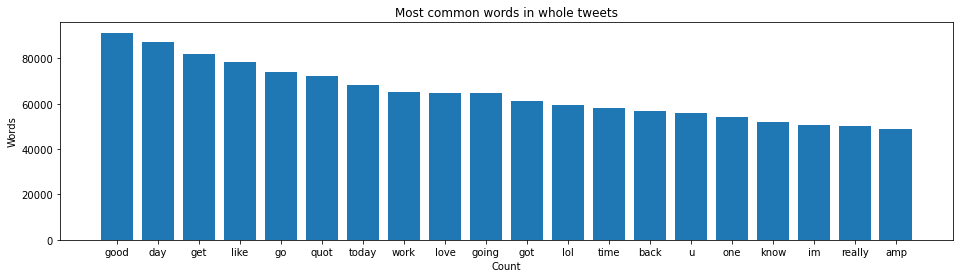

In [23]:
import collections
from wordcloud import WordCloud
from nltk import word_tokenize, sent_tokenize
from nltk.util import ngrams

all_tweets = ' '.join(df['tweet'].str.lower())

f_words = [word for word in all_tweets.split()]
counted_words = collections.Counter(f_words)

words = []
counts = []
for letter, count in counted_words.most_common(20):
    words.append(letter)
    counts.append(count)
    
plt.figure(figsize = (16, 4))
plt.title('Most common words in whole tweets')
plt.xlabel('Count')
plt.ylabel('Words')
plt.bar(words, counts)

### Positives

<BarContainer object of 20 artists>

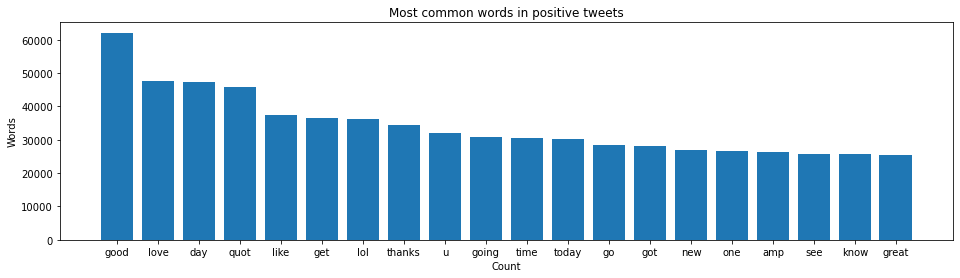

In [24]:
all_tweets = ' '.join(df[df.label == 'Positive'].tweet.str.lower())

f_words = [word for word in all_tweets.split()]
counted_words = collections.Counter(f_words)

words = []
counts = []
for letter, count in counted_words.most_common(20):
    words.append(letter)
    counts.append(count)
    
plt.figure(figsize = (16, 4))
plt.title('Most common words in positive tweets')
plt.xlabel('Count')
plt.ylabel('Words')
plt.bar(words, counts)

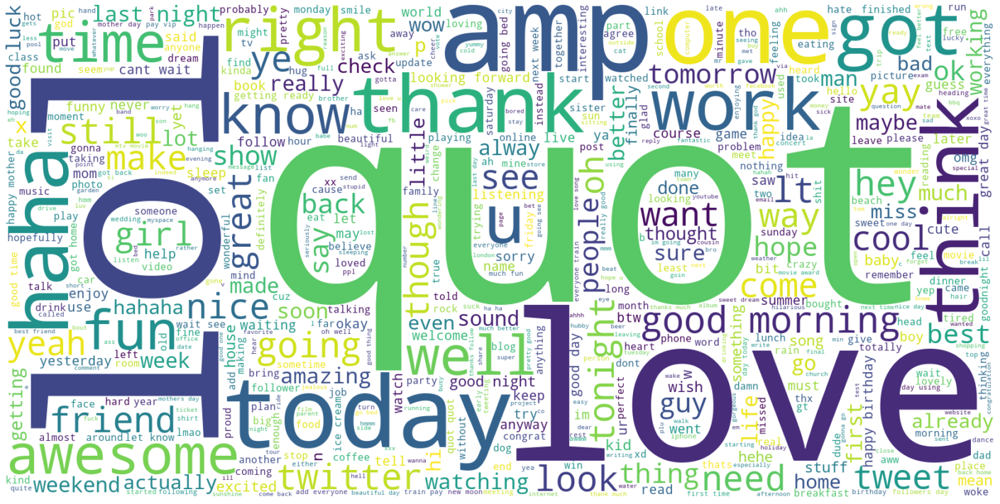

In [25]:
plt.figure(figsize = (25, 25))
plt.axis('off')
wordcloud_fig = WordCloud(max_words = 2000 , width = 1600 , height = 800, background_color ='white', min_font_size = 10).generate(" ".join(df[df.label == 'Positive'].tweet))
plt.imshow(wordcloud_fig, interpolation = 'bilinear')

### Negatives

<BarContainer object of 20 artists>

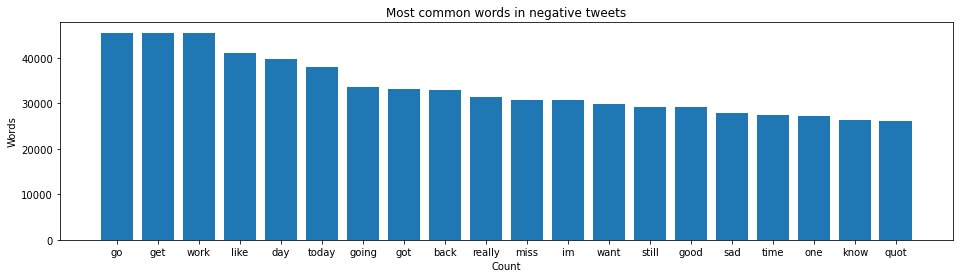

In [26]:
all_tweets = ' '.join(df[df.label == 'Negative'].tweet.str.lower())

f_words = [word for word in all_tweets.split()]
counted_words = collections.Counter(f_words)

words = []
counts = []
for letter, count in counted_words.most_common(20):
    words.append(letter)
    counts.append(count)
    
plt.figure(figsize = (16, 4))
plt.title('Most common words in negative tweets')
plt.xlabel('Count')
plt.ylabel('Words')
plt.bar(words, counts)

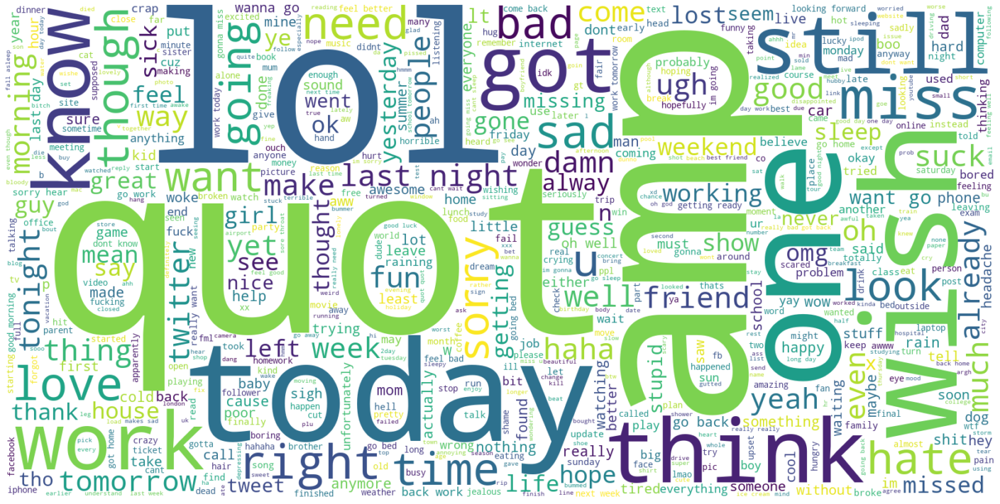

In [27]:
from wordcloud import WordCloud

plt.figure(figsize = (25, 25))
plt.axis('off')
wordcloud_fig = WordCloud(max_words = 2000 , width = 1600 , height = 800, background_color ='white', min_font_size = 10).generate(" ".join(df[df.label == 'Negative'].tweet))
plt.imshow(wordcloud_fig, interpolation = 'bilinear')

### Training Data and Test Data Splitting

In [28]:
from sklearn.model_selection import train_test_split

train_data, test_data = train_test_split(df, test_size=0.2, random_state=7)
print('Training Data', len(train_data), 'Test Data', len(test_data))

train_data.head(10)

Training Data 1273862 Test Data 318466


,label,tweet
927561,Positive,thank
810082,Positive,shakin money tree headed back car business
1153331,Positive,tasmania okay chat ya later
988182,Positive,yeah 100 tab storm towelled raiders awesome
543405,Negative,happy mari asleep gotta start laundry b4 wakes...
22855,Negative,wanting go city raining gotta homework 2
483675,Negative,sitting home bored x
667231,Negative,miss amy cards
1370823,Positive,dinner hubby two us 10 coupo
94439,Negative,know prob running around


In [29]:
test_data.head(10)

,label,tweet
1414233,Positive,nice job thanks
181653,Negative,way wanna shower n get pretty
788422,Negative,woke early think anyone completely bored
76646,Negative,lucky u scheduled today happy camper lol
972366,Positive,way cute curt hope school raised tons money lo...
797869,Negative,stupid braces making lips dry
1129919,Positive,good miss
1036078,Positive,past days sucked hopefully weekend happier
550532,Negative,marcus doubt megan fox good 2 years might get ...
1365388,Positive,going school contempt fash exams going conquer...


### Tokenization

In [30]:
from keras.preprocessing.text import Tokenizer

tokenizer = Tokenizer()
tokenizer.fit_on_texts(train_data.tweet)
word_index = tokenizer.word_index
vocab_size = len(tokenizer.word_index) + 1
print("Vocabulary Size :", vocab_size)

Vocabulary Size : 290458


In [31]:
from keras.preprocessing.sequence import pad_sequences

X_train = pad_sequences(tokenizer.texts_to_sequences(train_data.tweet), maxlen = 30)
X_test = pad_sequences(tokenizer.texts_to_sequences(test_data.tweet), maxlen = 30)

print("X_train, X_test", X_train.shape, X_test.shape)

labels = train_data.label.unique().tolist()

X_train, X_test (1273862, 30) (318466, 30)


In [32]:
encoder = LabelEncoder()
encoder.fit(train_data.label.to_list())

y_train = encoder.transform(train_data.label.to_list())
y_test = encoder.transform(test_data.label.to_list())

y_train = y_train.reshape(-1,1)
y_test = y_test.reshape(-1,1)

print("y_train shape:", y_train.shape)
print("y_test shape:", y_test.shape)

y_train shape: (1273862, 1)
y_test shape: (318466, 1)


### GLOVE Embedding

In [33]:
MODELS_PATH = '../models'
EMBEDDING_DIMENSION = 300

In [34]:
import tensorflow as tf

BATCH_SIZE = 1024
EPOCHS = 10
LR = 1e-3

embeddings_index = {}

glove_file = open('../glove/glove.6B.300d.txt', encoding='utf8')
for line in glove_file:
    values = line.split()
    word = value = values[0]
    coefficients = np.asarray(values[1:], dtype='float32')
    embeddings_index[word] = coefficients
glove_file.close()

print('%s word vectors.' % len(embeddings_index))


embedding_matrix = np.zeros((vocab_size, EMBEDDING_DIMENSION))
for word, i in word_index.items():
    embedding_vector = embeddings_index.get(word)
    if embedding_vector is not None:
        embedding_matrix[i] = embedding_vector
        
embedding_layer = tf.keras.layers.Embedding(vocab_size, EMBEDDING_DIMENSION, weights=[embedding_matrix], input_length=30, trainable=False)

400000 word vectors.


## Feature Extraction

### Bag of Words

In [35]:
from sklearn.feature_extraction.text import CountVectorizer

K = 20000
shuffled_df = df.sample(frac=1).reset_index(drop=True)
first_K_tweets = shuffled_df['tweet'].head(K)

vectorizer = CountVectorizer(stop_words='english')
vectorizer.fit(first_K_tweets)

# Dictionary
vectorizer.get_feature_names()

['00',
 '000',
 '00000',
 '000th',
 '00am',
 '01',
 '01am',
 '03',
 '0300',
 '0347',
 '04',
 '05',
 '054',
 '06',
 '060',
 '07',
 '07958938647',
 '08',
 '09',
 '0g',
 '0hh',
 '0s3',
 '10',
 '100',
 '1000',
 '100000',
 '1000000000',
 '10000s',
 '1000th',
 '100f',
 '100k',
 '100th',
 '100x',
 '101',
 '1010',
 '101f',
 '102',
 '103',
 '1030',
 '105f',
 '105th',
 '106fm',
 '108',
 '1080p',
 '10am',
 '10hour',
 '10k',
 '10mins',
 '10pm',
 '10th',
 '10x',
 '10yrs',
 '11',
 '110',
 '112',
 '113',
 '1130',
 '115',
 '118',
 '11am',
 '11june09',
 '11minutes',
 '11pm',
 '11s',
 '11th',
 '11yo',
 '12',
 '120',
 '1200',
 '1224',
 '126',
 '128',
 '12hr',
 '12p',
 '12pm',
 '12th',
 '13',
 '1300',
 '130am',
 '133',
 '135',
 '139001',
 '13th',
 '14',
 '140',
 '1400',
 '140conf',
 '140lovebird',
 '140th',
 '14190',
 '144',
 '146',
 '14hr',
 '14k',
 '14mm',
 '14sec',
 '14th',
 '14yr',
 '15',
 '150',
 '1500',
 '151',
 '152',
 '15639',
 '15am',
 '15min',
 '15th',
 '16',
 '160',
 '165',
 '1650',
 '16bit',
 

In [36]:
# Transform each tweets in vector space
vector = vectorizer.transform(first_K_tweets)
vector_spaces = vector.toarray()

vector_spaces

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=int64)

In [37]:
for i, v in zip(first_K_tweets, vector_spaces):
    print(i)
    print(v)

lol buy u big star wars pants 4 xmas
[0 0 0 ... 0 0 0]
glad hear
[0 0 0 ... 0 0 0]
maker faire
[0 0 0 ... 0 0 0]
everyone mistake school kid bloody medical college gonna b doc years
[0 0 0 ... 0 0 0]
thanks helping get shouting phase song loved
[0 0 0 ... 0 0 0]
munched good meal almost 2 days
[0 0 0 ... 0 0 0]
today concert sorry going
[0 0 0 ... 0 0 0]
oops bad quot olympicks quot sowwy yea ull hear one days
[0 0 0 ... 0 0 0]
gonna get fat late night snacking piggy
[0 0 0 ... 0 0 0]
hate wen technology backfires started gr8 day wid gang getting back togther
[0 0 0 ... 0 0 0]
haha whatever
[0 0 0 ... 0 0 0]
hangin boyfriends pjs watchin movie
[0 0 0 ... 0 0 0]
watch watching russell brand videos fu
[0 0 0 ... 0 0 0]
finally taking nap
[0 0 0 ... 0 0 0]
hope every mom wonderful mother day
[0 0 0 ... 0 0 0]
jst woke shld went bed earler eyes feel like lead
[0 0 0 ... 0 0 0]
damn tons work finish flight djangocon much sleep tonight
[0 0 0 ... 0 0 0]
know funny bright white legs lol
[0 0 

left
[0 0 0 ... 0 0 0]
awh dont
[0 0 0 ... 0 0 0]
could talk properly anybody office today bad mouth ulcers right tongue hope things better tomorrow
[0 0 0 ... 0 0 0]
sucky night bored home
[0 0 0 ... 0 0 0]
oops late bye blessed
[0 0 0 ... 0 0 0]
im sadd confusedd
[0 0 0 ... 0 0 0]
finger really really hurts
[0 0 0 ... 0 0 0]
dammit fack let converse
[0 0 0 ... 0 0 0]
love boyfriend much wish could spend every day miss
[0 0 0 ... 0 0 0]
overcast perfect midge
[0 0 0 ... 0 0 0]
oh need new work shoes broke one
[0 0 0 ... 0 0 0]
think going die heat exhaustion
[0 0 0 ... 0 0 0]
takes everything except good times know real best friends
[0 0 0 ... 0 0 0]
wish
[0 0 0 ... 0 0 0]
recieves sends texts phone go web browser yeah way
[0 0 0 ... 0 0 0]
exactly joint gotta poppin
[0 0 0 ... 0 0 0]
sunny
[0 0 0 ... 0 0 0]
nose burned look stupy
[0 0 0 ... 0 0 0]
google app engine meant terrorists
[0 0 0 ... 0 0 0]
thought said drag hell tonight thinking wtf haha fun
[0 0 0 ... 0 0 0]
fun ben daniel

chanqed backqround
[0 0 0 ... 0 0 0]
certainly comment blog asparagus
[0 0 0 ... 0 0 0]
grrr today rubbish day
[0 0 0 ... 0 0 0]
ya got something baseball
[0 0 0 ... 0 0 0]
hope win miley blessings fun sweetie
[0 0 0 ... 0 0 0]
loads piano work statement
[0 0 0 ... 0 0 0]
im soo bored followers time soo whats piont
[0 0 0 ... 0 0 0]
omg text go jus saw screen inbox seein ish hope aaahhh
[0 0 0 ... 0 0 0]
finally getting bed yay
[0 0 0 ... 0 0 0]
lmao honestly wanted go sleep ex someone know twitter wouldnt let get rest
[0 0 0 ... 0 0 0]
thanks
[0 0 0 ... 0 0 0]
graduation great high school kool n girl college start bauder college aug 11 omg im offically grown feel n gud
[0 0 0 ... 0 0 0]
noooooo shanedawson changed youtube channel beta 2 0 beta 2 0 taking world
[0 0 0 ... 0 0 0]
last day school started morning running full speed 3 blocks catch bus lol
[0 0 0 ... 0 0 0]
comedy less cat hoping sparta amp loki vids sir
[0 0 0 ... 0 0 0]
jumped waterfall oh yeah cold though
[0 0 0 ... 0 0 

[0 0 0 ... 0 0 0]
bryan koval dang get away anything
[0 0 0 ... 0 0 0]
sucks expecting homework lots guess
[0 0 0 ... 0 0 0]
back went
[0 0 0 ... 0 0 0]
watching cartoons floyd want bake something flour
[0 0 0 ... 0 0 0]
sigh big party tonight feeling well
[0 0 0 ... 0 0 0]
like mom always meets famous celeberities johnny depp marc jacobs hallie berry bruce willis amp cameron diaz mom gt
[0 0 0 ... 0 0 0]
add exteen
[0 0 0 ... 0 0 0]
good night world still 5 c mon people get 6
[0 0 0 ... 0 0 0]
going many blog gt tweet entries flooding contacts
[0 0 0 ... 0 0 0]
bellacullen18 ok got crying leah frowns thought talking dead fathers
[0 0 0 ... 0 0 0]
believe gorgeous weather getting amazing time start biking schedule yay summer summer summer
[0 0 0 ... 0 0 0]
m4 3 prime yet prime even put nikon 28mm ai lens g1 still 56mm equivalent
[0 0 0 ... 0 0 0]
dislike cooking greatly
[0 0 0 ... 0 0 0]
listen weeks show episode 197 phunk investigation guest mix
[0 0 0 ... 0 0 0]
mmmm yes please xd ac

lol look like night person party type girl mean since 8 morning
[0 0 0 ... 0 0 0]
know much bus fare costs days want walk morning sun really enough time
[0 0 0 ... 0 0 0]
sciatica sides back partial bed rest amp amp collect stool culture b c think e coli
[0 0 0 ... 0 0 0]
10 year goal gt gt figure keep away moat
[0 0 0 ... 0 0 0]
hi busy hell missing da 24 7 lt 3
[0 0 0 ... 0 0 0]
know talking people talk time miss
[0 0 0 ... 0 0 0]
probably long way sadly
[0 0 0 ... 0 0 0]
nose dripping im drinking apple juice outside right
[0 0 0 ... 0 0 0]
love sister hellaphresh
[0 0 0 ... 0 0 0]
omg recolor hair
[0 0 0 ... 0 0 0]
sleep think slept late morning
[0 0 0 ... 0 0 0]
aww sucks climbing sounds fun though xxx
[0 0 0 ... 0 0 0]
wit dah princess uv course missin mucho idk ughhh gotta geht thisz mah chest kusz hesz dah best amp amp amp want
[0 0 0 ... 0 0 0]
got done tanning nice
[0 0 0 ... 0 0 0]
think could probably pull
[0 0 0 ... 0 0 0]
arrrghhhh fashion show tomorrow postponed sooo look

[0 0 0 ... 0 0 0]
sisters dragging go upstairs already good night wish computer room
[0 0 0 ... 0 0 0]
know already looking online see lol
[0 0 0 ... 0 0 0]
kdubs moms bday
[0 0 0 ... 0 0 0]
west coast friends want sms stave boredom airport r asleep someone im
[0 0 0 ... 0 0 0]
lol american proverb eh well personal experience depends cake baked eaten
[0 0 0 ... 0 0 0]
camera ready weather like
[0 0 0 ... 0 0 0]
thanks glad like em amp among favourites
[0 0 0 ... 0 0 0]
omg red sabastian little mermaid hurts
[0 0 0 ... 0 0 0]
63 year old runner stop 9 miles short 10 day 500 mile goal
[0 0 0 ... 0 0 0]
trending click see
[0 0 0 ... 0 0 0]
hcc friends kick ass hardcore fb
[0 0 0 ... 0 0 0]
jo l donnt feelo gooood justt takin dogey cokeecainee errrgghhhhhh
[0 0 0 ... 0 0 0]
wishing sink fixed
[0 0 0 ... 0 0 0]
quot aurora quot yet wow honestly complaining asot400
[0 0 0 ... 0 0 0]
pho lunch burger dinner guilty pleasure
[0 0 0 ... 0 0 0]
burrito wine later
[0 0 0 ... 0 0 0]
came bed
[0 0 0

[0 0 0 ... 0 0 0]
taught love mean
[0 0 0 ... 0 0 0]
maybe right sort tips help
[0 0 0 ... 0 0 0]
cool way better saturday drank made ass front family
[0 0 0 ... 0 0 0]
busy fun mother day thanks got wanted wii fit yay
[0 0 0 ... 0 0 0]
last night raid fun downed 3 4 keepers loot hero
[0 0 0 ... 0 0 0]
thanks leaving glasses cute
[0 0 0 ... 0 0 0]
fun gym
[0 0 0 ... 0 0 0]
glad home okay mate
[0 0 0 ... 0 0 0]
love friends family
[0 0 0 ... 0 0 0]
awww taking anything used get throat infections time singer n fun
[0 0 0 ... 0 0 0]
slowly breaking addiction burt bees excited shooting leslie jordan yesterday mink stole today
[0 0 0 ... 0 0 0]
drinking coffee yummy
[0 0 0 ... 0 0 0]
oh wow good luck lax traffic shit sucks everytime go wack
[0 0 0 ... 0 0 0]
omgosh harv think amazazazing
[0 0 0 ... 0 0 0]
yuuckk got flu take tylenol
[0 0 0 ... 0 0 0]
ohh yes nearly seeing american rejects though
[0 0 0 ... 0 0 0]
ooh sounds like plan stow away luggage exchange 3 chuppa chups amp packet jaff

[0 0 0 ... 0 0 0]
home studying biology exam english exam ughh cannot wait torture ends
[0 0 0 ... 0 0 0]
3 30am tired going sleep yup goodnight twitterville
[0 0 0 ... 0 0 0]
mmkay logging
[0 0 0 ... 0 0 0]
shocker stefy mom tells yo sis walking
[0 0 0 ... 0 0 0]
says first day ok
[0 0 0 ... 0 0 0]
ahhhh wait leave bored
[0 0 0 ... 0 0 0]
well hopefully u finish 1030 disappointed miss
[0 0 0 ... 0 0 0]
give another hint kame hahaha ja ne
[0 0 0 ... 0 0 0]
back work mrseoliver isnt little sad actually oh well show must go
[0 0 0 ... 0 0 0]
awww man hubby sleep call u see baby
[0 0 0 ... 0 0 0]
congratulations chris gayle amp west indies team superb clinically precised demolition ponting aussie team classic wt20
[0 0 0 ... 0 0 0]
well thx youngest daughter bn hre 4 dew days neices amp nephews lovely hre 2 day 2
[0 0 0 ... 0 0 0]
dontlietomecuzicanttakeit iheartsyouharderlikewhoa
[0 0 0 ... 0 0 0]
two joystiq contests bookmarked one entry per day forgot enter today boo urns
[0 0 0 ... 0 

cold going play wow
[0 0 0 ... 0 0 0]
want go home
[0 0 0 ... 0 0 0]
xterra northwest cup ross going hijack twitter post race updates today action unfolds
[0 0 0 ... 0 0 0]
geuss graduating canges natohing alll
[0 0 0 ... 0 0 0]
wow feel sooo much better today sun lifted spirits felt like alleluia
[0 0 0 ... 0 0 0]
one improves stay comfort zone set goals high great
[0 0 0 ... 0 0 0]
feel half face awesome nph 36th birthday today everyone reason party
[0 0 0 ... 0 0 0]
time bed although think stick stars good night everyone xoxo
[0 0 0 ... 0 0 0]
rain rain go away
[0 0 0 ... 0 0 0]
kid free week yea still mourning death doggie week boo
[0 0 0 ... 0 0 0]
loving new hair style
[0 0 0 ... 0 0 0]
cool many quot pack quot
[0 0 0 ... 0 0 0]
missing shannon
[0 0 0 ... 0 0 0]
got time day long see computer screen sun time close curtains
[0 0 0 ... 0 0 0]
haha hmm ya bored saw pictures ron hermy makes go wild really wild haha
[0 0 0 ... 0 0 0]
new landlord called cant move tomorrow morning way 

rss feed site
[0 0 0 ... 0 0 0]
pooo gente tem q viver offline tbm n ficar online feriadao inteiro complica
[0 0 0 ... 0 0 0]
know finally heard news sad
[0 0 0 ... 0 0 0]
quot katy perry kissed girl quot added list divinyls
[0 0 0 ... 0 0 0]
guess going hillsong
[0 0 0 ... 0 0 0]
nice ladym holding 2 huge cups soda held door open left truck stop
[0 0 0 ... 0 0 0]
know finland summer short least snow much
[0 0 0 ... 0 0 0]
probably ton stuff catch today bet awesome though
[0 0 0 ... 0 0 0]
gave checked everywhere cant find okay guess coz put memory box ily xxxx
[0 0 0 ... 0 0 0]
dota addiction waste 6 7 hours playing dota
[0 0 0 ... 0 0 0]
finally done ganun lang un ha k preparing surprise cos mom bday hihi
[0 0 0 ... 0 0 0]
protest facebook rant man step defend
[0 0 0 ... 0 0 0]
ps stop following hurt feelings
[0 0 0 ... 0 0 0]
worries
[0 0 0 ... 0 0 0]
yeah apt college went temple u
[0 0 0 ... 0 0 0]
rt swag2tuffyou team jumper lol epiphanygirl lt lol aritst flighty live hearts n exc

[0 0 0 ... 0 0 0]
painting
[0 0 0 ... 0 0 0]
sucks
[0 0 0 ... 0 0 0]
oh yeah let make things right
[0 0 0 ... 0 0 0]
school till 3
[0 0 0 ... 0 0 0]
watching boston marathon live via www universalsports com
[0 0 0 ... 0 0 0]
app store
[0 0 0 ... 0 0 0]
wish sang song rock band
[0 0 0 ... 0 0 0]
home la playa apart super cold n overcast n random jagged waste sand fun volley n football least
[0 0 0 ... 0 0 0]
sun isnt shining
[0 0 0 ... 0 0 0]
love pulling going song cd finishes know going good day everything sync
[0 0 0 ... 0 0 0]
tonight saw chrishasboobs dream nice dream
[0 0 0 ... 0 0 0]
obsessively social networking via phone free 16 mbps internet free electricity thanks delhi airport
[0 0 0 ... 0 0 0]
bummer never make high speed ones u bummer
[0 0 0 ... 0 0 0]
bout get dressed 4 day thinkin cute dress sandals 2 bad dressing 4 work
[0 0 0 ... 0 0 0]
bed every five minutes today im never getting wrecked
[0 0 0 ... 0 0 0]
wearing one
[0 0 0 ... 0 0 0]
current users get priority last 

sure sure last short answer remember back nice layered oops x post
[0 0 0 ... 0 0 0]
done wes live im still cleaning room sleep til clothes bed please entertain
[0 0 0 ... 0 0 0]
think go sleep considering hav b 3hrs
[0 0 0 ... 0 0 0]
eu sou estat stica
[0 0 0 ... 0 0 0]
ashishmohta
[0 0 0 ... 0 0 0]
used big brother
[0 0 0 ... 0 0 0]
english get yelled homework wish luck
[0 0 0 ... 0 0 0]
working today going work effing sick
[0 0 0 ... 0 0 0]
think call whenever lot stuff including getting phone
[0 0 0 ... 0 0 0]
dreams getting weird wanna sleep anymore
[0 0 0 ... 0 0 0]
wishing daine heaven miss soo much
[0 0 0 ... 0 0 0]
finally got chill good friend mine agreed hang every week date personal lives
[0 0 0 ... 0 0 0]
cheers bb hmmm dunno
[0 0 0 ... 0 0 0]
lt lied said get sick airhead
[0 0 0 ... 0 0 0]
listening new jonasbrothers cd one best lt 3 proud boys
[0 0 0 ... 0 0 0]
totally serious anticipated seen new star trek movie recommend great stuff
[0 0 0 ... 0 0 0]
lol played lot gui

[0 0 0 ... 0 0 0]
omg scary dream cant sleep
[0 0 0 ... 0 0 0]
loving sun youghal bit hungover though
[0 0 0 ... 0 0 0]
welll twitter officially boring
[0 0 0 ... 0 0 0]
sure movie great care like warm blanket childhood memories replacements tunes
[0 0 0 ... 0 0 0]
think ur sending dm 2 wrong person lol ur using quot quot symbol front name j logic click reply dm
[0 0 0 ... 0 0 0]
june shriners update kendrick perkins added tix available unfortunately jacoby ellsbury cancelled appearance
[0 0 0 ... 0 0 0]
yeah model today portrait project photography
[0 0 0 ... 0 0 0]
hates getting raked artificially inflated closing costs
[0 0 0 ... 0 0 0]
needs poker chips
[0 0 0 ... 0 0 0]
kissmyairs started following omg thaaanks haha sound desperate
[0 0 0 ... 0 0 0]
sun rays totally woke hate waking alarm 22minutes
[0 0 0 ... 0 0 0]
almost time summer chemistry class
[0 0 0 ... 0 0 0]
sad bigant gone week going e3 least live vicariously
[0 0 0 ... 0 0 0]
since 3 feels really sick
[0 0 0 ... 0 0 0]

laptops working tired holidays boring haha
[0 0 0 ... 0 0 0]
look yay work killed though
[0 0 0 ... 0 0 0]
look book
[0 0 0 ... 0 0 0]
nice meet backstage mansfield pleeease
[0 0 0 ... 0 0 0]
oh rains pours long l say forget wash start hope son feels better
[0 0 0 ... 0 0 0]
didnt get take
[0 0 0 ... 0 0 0]
thx
[0 0 0 ... 0 0 0]
finally finished paying stack bills avoiding ramen mac amp cheese pb amp j next two weeks
[0 0 0 ... 0 0 0]
missed cassie school today
[0 0 0 ... 0 0 0]
okay know iv aready said ill say agian love weather please sun dont leave us
[0 0 0 ... 0 0 0]
gonna get worse mention horrid sunburn boat omg worst ever feel pain
[0 0 0 ... 0 0 0]
sooo excited new moon afraid might die caused expectations big screen
[0 0 0 ... 0 0 0]
sat bench shade
[0 0 0 ... 0 0 0]
waiting easter
[0 0 0 ... 0 0 0]
kids seven days school left lol
[0 0 0 ... 0 0 0]
got new contacts longer blind woo spent discount accessorize
[0 0 0 ... 0 0 0]
cool
[0 0 0 ... 0 0 0]
good evening everyone phili

[0 0 0 ... 0 0 0]
last night fun fire old friends beer squeeze could nt gotten better hoping tanning bed shower
[0 0 0 ... 0 0 0]
watching mtv movie awards guess hilary isnt awesome
[0 0 0 ... 0 0 0]
alone week sarah girls northern illinois week
[0 0 0 ... 0 0 0]
maria didnt know u greek wait til tell 12 yr old son thinks u prettiest adores u
[0 0 0 ... 0 0 0]
woo got 2 rolls film back walgreens wish wasnt dang expensive almost 30
[0 0 0 ... 0 0 0]
new moon robert shirtless working
[0 0 0 ... 0 0 0]
seriously considering cept artsy fartsy ppl scattered states energy 1 place tho
[0 0 0 ... 0 0 0]
following takes time get
[0 0 0 ... 0 0 0]
home alone dishes
[0 0 0 ... 0 0 0]
whooo hooo
[0 0 0 ... 0 0 0]
sorry babe rotten song stuck jesse songs bad honestly rather hear britney
[0 0 0 ... 0 0 0]
getting ready class till 12 lab till 4 home couple days going movies 2nite cool people
[0 0 0 ... 0 0 0]
cool thanks awesome doggie whoever owns must looking
[0 0 0 ... 0 0 0]
nothing tv
[0 0 0 ...

[0 0 0 ... 0 0 0]
happy jonas day
[0 0 0 ... 0 0 0]
buy buy iphone 3g 440 payg paid 340 6 months ago one
[0 0 0 ... 0 0 0]
panic disco radio sad know song panic disco song turns ipod
[0 0 0 ... 0 0 0]
started ubuntu started yet busy lazy
[0 0 0 ... 0 0 0]
thats cool lt 3
[0 0 0 ... 0 0 0]
ugh go brother stupid baseball game wish volleyball
[0 0 0 ... 0 0 0]
saulg 13 god need hug
[0 0 0 ... 0 0 0]
im telling im showing much loved
[0 0 0 ... 0 0 0]
dang tried win brad paisely concert tickets caller thirteen caller twelve
[0 0 0 ... 0 0 0]
going make pride today rather early leaving news horrible friend new haircut
[0 0 0 ... 0 0 0]
help find hahahahaha aww poor kitty though hope comes back
[0 0 0 ... 0 0 0]
lol u sound like goober exactly way dvr set amp psyched pun sharona back monk
[0 0 0 ... 0 0 0]
mr russ chance approve draft write wed morning time need email set audience 18 june
[0 0 0 ... 0 0 0]
bought super cute dress
[0 0 0 ... 0 0 0]
quot comics podcast quot go
[0 0 0 ... 0 0 0]

fruit baskets fix everything
[0 0 0 ... 0 0 0]
thanks birthday wish buddy
[0 0 0 ... 0 0 0]
9 year old nephew emailed asking 2 join 2 play mini golf bad breakfast amp meet amp greet tyson cute
[0 0 0 ... 0 0 0]
julian smith win diversity second susan third im angry guys
[0 0 0 ... 0 0 0]
good home fun wedding hope sleeping right sleep ahhhhh
[0 0 0 ... 0 0 0]
wednesday already bad work saturday tgif
[0 0 0 ... 0 0 0]
poor meggz pneumonia stay bed 7 days
[0 0 0 ... 0 0 0]
norwegian tune winner 2009 eurovision annoyingly catchy seem get head
[0 0 0 ... 0 0 0]
finally moved internet yet home
[0 0 0 ... 0 0 0]
watchin cousin game ucr persssy
[0 0 0 ... 0 0 0]
twittering cellmate89 account toilet
[0 0 0 ... 0 0 0]
back cape coral
[0 0 0 ... 0 0 0]
okay temp 97 2f drm office wtf hurry doc come see wanna know ifits mono tonsilitis
[0 0 0 ... 0 0 0]
today last exam wahooooooo
[0 0 0 ... 0 0 0]
thats f king hate url shortners last link got rick roll im happy haha
[0 0 0 ... 0 0 0]
ahh brenda ni

[0 0 0 ... 0 0 0]
seriously looking 4 input ms crm 4 0 choose gotta work w html showing everywhere email activity report anyone
[0 0 0 ... 0 0 0]
cramming school works due tomorrow yeah csb start class tomorrow asking hay
[0 0 0 ... 0 0 0]
car get hurt
[0 0 0 ... 0 0 0]
ill see later haha
[0 0 0 ... 0 0 0]
hate mondays
[0 0 0 ... 0 0 0]
guess made cupcakes whatelse neeeddddddddd
[0 0 0 ... 0 0 0]
ummm dont like cone shame
[0 0 0 ... 0 0 0]
watched star trek quot quot cant wait next round maybe tomorrow imax
[0 0 0 ... 0 0 0]
let keep private
[0 0 0 ... 0 0 0]
feels forgotten damn wont call
[0 0 0 ... 0 0 0]
thankful er night going pretty slowwww think something back
[0 0 0 ... 0 0 0]
wanna cryy
[0 0 0 ... 0 0 0]
examines cleaned kitchen spic span wonderful job ladies rest evening enjoy katis kot
[0 0 0 ... 0 0 0]
since days got strange error quot ksmserver could start quot fancy x window decoration x server dies
[0 0 0 ... 0 0 0]
nice
[0 0 0 ... 0 0 0]
toys r us doen even oh well
[0 0 

good better way better going mornin service
[0 0 0 ... 0 0 0]
sort another 3 m8
[0 0 0 ... 0 0 0]
nah well maybe think probably stress bet tonight would typical haha
[0 0 0 ... 0 0 0]
look verrrry cute hope get know day
[0 0 0 ... 0 0 0]
outlet mall plus gatchalians
[0 0 0 ... 0 0 0]
heeey wat ur dogs called many ya got
[0 0 0 ... 0 0 0]
sitting garden big black cloud appeared blocked sunlight
[0 0 0 ... 0 0 0]
got lot good work done jobs week looking forward lecture glen rose tomorrow
[0 0 0 ... 0 0 0]
pile books fall top well suitcase trying find sisters keeper ouch
[0 0 0 ... 0 0 0]
parking lot 45 south beltway 8
[0 0 0 ... 0 0 0]
race life today apparently think meant
[0 0 0 ... 0 0 0]
follow u excessive twitter poster lol quot overtweet quot
[0 0 0 ... 0 0 0]
sunny go beach im stuck home essays 20 degrees
[0 0 0 ... 0 0 0]
got shower time take nap
[0 0 0 ... 0 0 0]
congrats graduation know going college
[0 0 0 ... 0 0 0]
ahhh ff didnt work
[0 0 0 ... 0 0 0]
allmost done need help 

yes know u mean u never know mood person end
[0 0 0 ... 0 0 0]
yeah bill hulk
[0 0 0 ... 0 0 0]
bradley whitford jane kaczmarek divorce thats bad
[0 0 0 ... 0 0 0]
hard workn woman always sexy
[0 0 0 ... 0 0 0]
want one
[0 0 0 ... 0 0 0]
work today request days denied really hope miss ian graduation
[0 0 0 ... 0 0 0]
crack luv reminds kids little
[0 0 0 ... 0 0 0]
hey new fb app bb super fast still flaws well expect perfection god
[0 0 0 ... 0 0 0]
walk home town diiiiee ok myb whine cause eurgh im silly
[0 0 0 ... 0 0 0]
lol scaried girl joke telepatic powers reach california
[0 0 0 ... 0 0 0]
feel lil better bronchitis still kickin ass might able go weekend
[0 0 0 ... 0 0 0]
lost lyrics
[0 0 0 ... 0 0 0]
im trying figure twitter thing works
[0 0 0 ... 0 0 0]
sketchy people suck
[0 0 0 ... 0 0 0]
wondering put full regrets really could time machine things could different
[0 0 0 ... 0 0 0]
wanna know damnnn track takes back
[0 0 0 ... 0 0 0]
kitty super cute excited play game futbol
[0

buying one nice
[0 0 0 ... 0 0 0]
phone iona joing twittering lt 3
[0 0 0 ... 0 0 0]
mum said put weight weighing scale showed weight im lazy run laaaaa bt choice alr haiyer
[0 0 0 ... 0 0 0]
adobe workiiiinnng bt dubs new phone yay white
[0 0 0 ... 0 0 0]
working tonight
[0 0 0 ... 0 0 0]
camp shoppinggggggggggg
[0 0 0 ... 0 0 0]
twitter finally joined follow follow u
[0 0 0 ... 0 0 0]
well mean use macs
[0 0 0 ... 0 0 0]
home last quot chillin relaxin maxin cool quot relaxing couple days
[0 0 0 ... 0 0 0]
follow dm win
[0 0 0 ... 0 0 0]
morning exam today eek
[0 0 0 ... 0 0 0]
going coral reef pool beach going gators get drink
[0 0 0 ... 0 0 0]
get airplane osh graphics shown would put airpigz map
[0 0 0 ... 0 0 0]
think getting sick really really need get better looking forward week
[0 0 0 ... 0 0 0]
called spread dammit put mney nba
[0 0 0 ... 0 0 0]
hot air balloon owl city lt ultimatee happy song
[0 0 0 ... 0 0 0]
lie taylor swift straighten hair
[0 0 0 ... 0 0 0]
good night twee

[0 0 0 ... 0 0 0]
really tell today show tell nice sister
[0 0 0 ... 0 0 0]
omg saw quot puppies behind bars quot episode bawling sorry ur bully sick one 2 best
[0 0 0 ... 0 0 0]
dude sorry ticks maybe jennifer kristian see tweet buy quot brand new car quot p
[0 0 0 ... 0 0 0]
running least 25 miles week yet gaining weight please let muscle
[0 0 0 ... 0 0 0]
always thought kind funny guess works
[0 0 0 ... 0 0 0]
cool
[0 0 0 ... 0 0 0]
happy sunday tyas
[0 0 0 ... 0 0 0]
watch find
[0 0 0 ... 0 0 0]
yea duh watch dat show lolz wooooooow hehe
[0 0 0 ... 0 0 0]
thanks followfriday
[0 0 0 ... 0 0 0]
woo getting uncles unused brooks seat 1953
[0 0 0 ... 0 0 0]
seem technical problems
[0 0 0 ... 0 0 0]
goin bed dreaming man alex skarsgard birthday 30 mins get present bff hehe
[0 0 0 ... 0 0 0]
started twitter need friends
[0 0 0 ... 0 0 0]
careful twilight obsession hard stop started speak experience
[0 0 0 ... 0 0 0]
make poster good luck trying collect hello souvenir thanks italy
[0 0 0 .

[0 0 0 ... 0 0 0]
thanks flowers
[0 0 0 ... 0 0 0]
oh hope everything ok girl
[0 0 0 ... 0 0 0]
working london week missing kevin kieran wee finlay first time leaving
[0 0 0 ... 0 0 0]
try swearing loudly clearly l w l
[0 0 0 ... 0 0 0]
thanks followfriday
[0 0 0 ... 0 0 0]
happy birthday
[0 0 0 ... 0 0 0]
guesss im coolifornia anymore exiting
[0 0 0 ... 0 0 0]
prom absolutely great wish would never ended wisconsin dells weekend
[0 0 0 ... 0 0 0]
well intend making muffins minute good start
[0 0 0 ... 0 0 0]
starts new job tomorrow
[0 0 0 ... 0 0 0]
saynerd01 oh look new house santa barbara hahha wish
[0 0 0 ... 0 0 0]
damage done today room wkend shoppin v
[0 0 0 ... 0 0 0]
working clients interested ranking higher google searches love challenge seo
[0 0 0 ... 0 0 0]
funny thought gonna say amp like oh noo good job
[0 0 0 ... 0 0 0]
finally saw shockwave player compatible vista grr
[0 0 0 ... 0 0 0]
bomb ass digity
[0 0 0 ... 0 0 0]
blog found
[0 0 0 ... 0 0 0]
cannnot sty focused im 

[0 0 0 ... 0 0 0]
aw miss u real
[0 0 0 ... 0 0 0]
love 3 little words
[0 0 0 ... 0 0 0]
goin bed sad
[0 0 0 ... 0 0 0]
miss bowie cutest
[0 0 0 ... 0 0 0]
lmao know many times ive heard lolol kidding least caught movin arm away
[0 0 0 ... 0 0 0]
happy mother day
[0 0 0 ... 0 0 0]
equally proud ancestors arrived free army one convicts became policeman
[0 0 0 ... 0 0 0]
time exam tomorrow
[0 0 0 ... 0 0 0]
omg spit drink rip hair straightener
[0 0 0 ... 0 0 0]
thanks hear bad today
[0 0 0 ... 0 0 0]
waaaa studied web said stay x rays id sat take care
[0 0 0 ... 0 0 0]
thanks check em
[0 0 0 ... 0 0 0]
poor
[0 0 0 ... 0 0 0]
sunny shorts p
[0 0 0 ... 0 0 0]
gotta honest thing saddens looking tweets sbc2009 women
[0 0 0 ... 0 0 0]
verizon sim card
[0 0 0 ... 0 0 0]
hey miley heard brought chickens home hm movie set chickens
[0 0 0 ... 0 0 0]
isss hoommmeee texaassss
[0 0 0 ... 0 0 0]
thanks rehearsals show increasing play
[0 0 0 ... 0 0 0]
haha nah wasnt totally fucked darn haha yeah im g

[0 0 0 ... 0 0 0]
r p robert ravin hardcore heaven im shock always remember times u mced 4 glad got share happy moments
[0 0 0 ... 0 0 0]
writing song amp amp course
[0 0 0 ... 0 0 0]
know messaged day email address somewhere podcasts find
[0 0 0 ... 0 0 0]
dropped c airport
[0 0 0 ... 0 0 0]
opposite problems understand amp use objective j easy never used javascript
[0 0 0 ... 0 0 0]
hate ditz sometimes like today work please remember office stop paging jokes expense
[0 0 0 ... 0 0 0]
bff love sister
[0 0 0 ... 0 0 0]
really im laughing feel like crying nd im stoooopit tired cause til 5am odd reason
[0 0 0 ... 0 0 0]
damn ordered pizza
[0 0 0 ... 0 0 0]
love copics must
[0 0 0 ... 0 0 0]
heard dublin sold right omw
[0 0 0 ... 0 0 0]
sit n look park
[0 0 0 ... 0 0 0]
yeah missed worries corrected record behalf trivia
[0 0 0 ... 0 0 0]
omg im dizzy
[0 0 0 ... 0 0 0]
going watch pink panther part duex later twitterites
[0 0 0 ... 0 0 0]
go monday good luck everyone
[0 0 0 ... 0 0 0]
real

[0 0 0 ... 0 0 0]
sooo jealous neomeze good time fine jealous love u guys
[0 0 0 ... 0 0 0]
4 times goodness well enjoy
[0 0 0 ... 0 0 0]
glad diversity bgt really liked aiden davis though glad susan boyle win
[0 0 0 ... 0 0 0]
making new song
[0 0 0 ... 0 0 0]
anyway supposed studying guess staying home really screws study plans
[0 0 0 ... 0 0 0]
called jerk feelings really hurt right
[0 0 0 ... 0 0 0]
question day easter bunny carry eggs rabbits lay eggs ooor theyy dnt googled jk
[0 0 0 ... 0 0 0]
surg tomorrow outpatient hoping quick recovery
[0 0 0 ... 0 0 0]
mmm lunch going bbq later fun xx
[0 0 0 ... 0 0 0]
another donuts another farewell
[0 0 0 ... 0 0 0]
preparing radio intervention dnr lu internet fraud live 10 30
[0 0 0 ... 0 0 0]
coming sydney cool meet id love meet favourite comedian
[0 0 0 ... 0 0 0]
fernando pe passed away sad
[0 0 0 ... 0 0 0]
minor brain overload show morning overall pleased product good first day back
[0 0 0 ... 0 0 0]
need get decent sleep wtf 5 amp s

[0 0 0 ... 0 0 0]
wish could see
[0 0 0 ... 0 0 0]
great time jealous lol
[0 0 0 ... 0 0 0]
oh shit got wrong
[0 0 0 ... 0 0 0]
okaaaayy miss last night
[0 0 0 ... 0 0 0]
feel like slept freight train back good morning twitters sore hell
[0 0 0 ... 0 0 0]
myspace wanting friend 2 hack page lukin 4 summer luv
[0 0 0 ... 0 0 0]
omg love movie grandpa hilarious
[0 0 0 ... 0 0 0]
jensenwilder cheers guys nearly things make
[0 0 0 ... 0 0 0]
hate earn much mp even afford food poor things
[0 0 0 ... 0 0 0]
man beached whales bought tears eyes nature really messed sometimes
[0 0 0 ... 0 0 0]
city day babeee
[0 0 0 ... 0 0 0]
oh thanks comments blog post looking forward delivering great content
[0 0 0 ... 0 0 0]
back future
[0 0 0 ... 0 0 0]
playing hub festival saturday 23rd may people wanna come check us
[0 0 0 ... 0 0 0]
shower quick tidy final round spider diagrams tomorrow exam boo
[0 0 0 ... 0 0 0]
im full happy watch fave shoooooow
[0 0 0 ... 0 0 0]
stuck house crazy girls
[0 0 0 ... 0 

back tweet little hope every1 much fun w
[0 0 0 ... 0 0 0]
killed shoulders gym hope able lift arms tomorrow shower body english
[0 0 0 ... 0 0 0]
yeah
[0 0 0 ... 0 0 0]
sad feet er roomies leaving morning
[0 0 0 ... 0 0 0]
ass love
[0 0 0 ... 0 0 0]
still sick shit im downloading shit load music gonna watch star wars hopefully cures
[0 0 0 ... 0 0 0]
went exhausted
[0 0 0 ... 0 0 0]
project gotham racing xbox
[0 0 0 ... 0 0 0]
aw amp really miss alice amp charlotte tonight dunno though hey spoons
[0 0 0 ... 0 0 0]
miss talking youuuu yikes spilling things computers mix well
[0 0 0 ... 0 0 0]
overkill nice map 3d drawing cleanup command belongs base acad imo
[0 0 0 ... 0 0 0]
got cute balinese wooden pen classmate
[0 0 0 ... 0 0 0]
oooog juls please take care geeett uuup
[0 0 0 ... 0 0 0]
hate thunderstorms
[0 0 0 ... 0 0 0]
oh know bad times twitter convo tonight
[0 0 0 ... 0 0 0]
woot chasers tonight
[0 0 0 ... 0 0 0]
need bottle vodka ana
[0 0 0 ... 0 0 0]
work text please
[0 0 0 ..

[0 0 0 ... 0 0 0]
really horrendous allergic reaction tongue sores face rash good time anymore
[0 0 0 ... 0 0 0]
good man dan
[0 0 0 ... 0 0 0]
misses playing lotro
[0 0 0 ... 0 0 0]
aww wonderful congrats
[0 0 0 ... 0 0 0]
love waking 4 00 morning work excited tomorrow though
[1 0 0 ... 0 0 0]
interviewing tomorrow hot wear suit
[0 0 0 ... 0 0 0]
good morning electricity 630
[0 0 0 ... 0 0 0]
nobody tells difference hair
[0 0 0 ... 0 0 0]
heyyy everyone miller says hi
[0 0 0 ... 0 0 0]
wait blink 182 30 seconds ta mars new album
[0 0 0 ... 0 0 0]
hate going bed hungry
[0 0 0 ... 0 0 0]
nothing exciting cargo home shop thousand times better laura ashley wait give notice
[0 0 0 ... 0 0 0]
ff follow cuz ms hip hop says sminglemebaby
[0 0 0 ... 0 0 0]
evening watched come dine made miss dundee even
[0 0 0 ... 0 0 0]
finally im home always feels better gym session
[0 0 0 ... 0 0 0]
jus wanna go back workin club sigh memories
[0 0 0 ... 0 0 0]
wayyy early go class summer
[0 0 0 ... 0 0 0]
l

[0 0 0 ... 0 0 0]
aah thankyou tell mum get next shops jsut told dad going wear gloves
[0 0 0 ... 0 0 0]
well miss yooou
[0 0 0 ... 0 0 0]
home dog caught rabbit tired also bikes gear system fell apart walking
[0 0 0 ... 0 0 0]
lot fun gery sorpse bday party love u girl
[0 0 0 ... 0 0 0]
monday blues
[0 0 0 ... 0 0 0]
needs second wind third fourth
[0 0 0 ... 0 0 0]
download tickets came yesterday wooooooooooop get
[0 0 0 ... 0 0 0]
know right makes sad
[0 0 0 ... 0 0 0]
ajaja dead chauffeurdebuzz
[0 0 0 ... 0 0 0]
80 unique visitors best day 300 page views good
[0 0 0 ... 0 0 0]
bout involves acai berries
[0 0 0 ... 0 0 0]
still laying vocals damn late hope everyone sleeping well
[0 0 0 ... 0 0 0]
true story really sucky queue stuck
[0 0 0 ... 0 0 0]
sad zekeketcham iz leavin fo ca week
[0 0 0 ... 0 0 0]
dealing exhausting u ever let know please love u psu main campus
[0 0 0 ... 0 0 0]
went dinner got bug bites legs thats get wearing dress guess fractured toe wtf summer
[0 0 0 ... 0 0

lol right sometimes de jigsaw ing understand exhausting
[0 0 0 ... 0 0 0]
hate dvd recorder tape obsessed gonna catch missed episode online play sims3 looking like rain today
[0 0 0 ... 0 0 0]
320 easy
[0 0 0 ... 0 0 0]
tired sad couldnt go pic nic blame clarks also intend blame failing exams general misery infliction
[0 0 0 ... 0 0 0]
pic
[0 0 0 ... 0 0 0]
poor ryan neal got heart broken
[0 0 0 ... 0 0 0]
work til 4 15 today going home study finals 2 weeks away finishing 1st year pharmacy school
[0 0 0 ... 0 0 0]
bored need fix little gliders updates hockeypulse energy
[0 0 0 ... 0 0 0]
dont think update yet
[0 0 0 ... 0 0 0]
ice lemon tea missed
[0 0 0 ... 0 0 0]
found owner iphone lol
[0 0 0 ... 0 0 0]
feel lonely going cry today greatest
[0 0 0 ... 0 0 0]
school english lit morning
[0 0 0 ... 0 0 0]
even important meeting copyright office like
[0 0 0 ... 0 0 0]
tired cold got cramps
[0 0 0 ... 0 0 0]
doesnt anyone understand trying sleep people wake ten violators shot
[0 0 0 ... 0 

[0 0 0 ... 0 0 0]
got brainbone daily question right
[0 0 0 ... 0 0 0]
tgif
[0 0 0 ... 0 0 0]
done work buy little sisters grad gift
[0 0 0 ... 0 0 0]
gym alone
[0 0 0 ... 0 0 0]
take
[0 0 0 ... 0 0 0]
hard watch italian earthquake stuff many old buildings gone hope aftershocks stop soon
[0 0 0 ... 0 0 0]
supposed getting 4 hours better hit sack nice shoot non people shots afternoon
[0 0 0 ... 0 0 0]
jaysus went buy netbook saw macbook air beautiful 1 000 dearer though decision postponed monday damn choice
[0 1 0 ... 0 0 0]
hahahaha nahh sowwieee git shirt match dez sneakerz nd idk da color aghhh lol
[0 0 0 ... 0 0 0]
bus exams week
[0 0 0 ... 0 0 0]
fly video
[0 0 0 ... 0 0 0]
head hurts sooo bad heart wawzaa cried alot last night went home
[0 0 0 ... 0 0 0]
ugh fun
[0 0 0 ... 0 0 0]
hey jonas makes us fan twitter hahaha sleep want
[0 0 0 ... 0 0 0]
according jason pollock need put followfriday ff doesnt count followfriday misskemi
[0 0 0 ... 0 0 0]
damn cover awful lady gaga needs le

[0 0 0 ... 0 0 0]
toy story today bbc1 totally happy tired 9 hours work happy ooh wont 10 2 scratch card today xxx
[0 0 0 ... 0 0 0]
classes tacos dr pepper going bed
[0 0 0 ... 0 0 0]
woohoo friday gotta spend day system install
[0 0 0 ... 0 0 0]
good night
[0 0 0 ... 0 0 0]
twittering first time tweeting wut ever
[0 0 0 ... 0 0 0]
call em tweet e mail hell em
[0 0 0 ... 0 0 0]
u like kiro hehe cutie sings russian haha tatu glad love russians 100 russian
[0 0 0 ... 0 0 0]
would like say sorry received emotional msgs last night fun time however
[0 0 0 ... 0 0 0]
checked thanks quick reply sorries im head right hell week
[0 0 0 ... 0 0 0]
im home tired lots fun parents anniversary today home alone taking naps ha
[0 0 0 ... 0 0 0]
home alone lol gcse nearly avv gona miss eastbrook class 2009 brap lol
[0 0 0 ... 0 0 0]
im needing sierra purell right
[0 0 0 ... 0 0 0]
yay
[0 0 0 ... 0 0 0]
umm besides come rain shine crazy madonna
[0 0 0 ... 0 0 0]
fine started day early today feels like n

[0 0 0 ... 0 0 0]
invited people
[0 0 0 ... 0 0 0]
fab weekend weather nice want go back work tomorrow
[0 0 0 ... 0 0 0]
highly recommends join www m2e asia earn money free shareholder dividends even nothing
[0 0 0 ... 0 0 0]
woohoooo already love man
[0 0 0 ... 0 0 0]
never fun teachers come back work today especially tough
[0 0 0 ... 0 0 0]
see things stand good moment afraid
[0 0 0 ... 0 0 0]
feel like going work feet still hurt
[0 0 0 ... 0 0 0]
god damn ham cant get twitterberry work
[0 0 0 ... 0 0 0]
cleaning audrey closet believe big getting goes fast
[0 0 0 ... 0 0 0]
going outside textable ringable one funniest voices ever throat anyone wants byeee
[0 0 0 ... 0 0 0]
well said saw comments obama inspired trolls infecting fb site sad
[0 0 0 ... 0 0 0]
guess one visit grandparents nursing home
[0 0 0 ... 0 0 0]
omg hahahah hello
[0 0 0 ... 0 0 0]
web filter work block sites way absolutely nothing would work instead 90 sites
[0 0 0 ... 0 0 0]
phone call yett hrmm maybe call end or

[0 0 0 ... 0 0 0]
gooo move 33 54 instablogs com
[0 0 0 ... 0 0 0]
lol well probably understand might well think something better
[0 0 0 ... 0 0 0]
take back excited school seeing courseload
[0 0 0 ... 0 0 0]
alllllll byyyyy myyyyyselffffff imagine singing walk around store lonely
[0 0 0 ... 0 0 0]
sama2 dear nice see slamat begadang yah
[0 0 0 ... 0 0 0]
naomily lt 3 omg love scene love every scene hehe
[0 0 0 ... 0 0 0]
speaking red boots saw gorgeous pair pretty metal detailing thrift shop bet never find em
[0 0 0 ... 0 0 0]
writer block business blog
[0 0 0 ... 0 0 0]
yum went walk never knew pretty nj houses haha hungry
[0 0 0 ... 0 0 0]
tomorrow last day caracas leaving monday
[0 0 0 ... 0 0 0]
got lasik see close
[0 0 0 ... 0 0 0]
yea welcomee
[0 0 0 ... 0 0 0]
everyone wish luck 15 hour work day today ah well worth
[0 0 0 ... 0 0 0]
nah nasty nasty cold
[0 0 0 ... 0 0 0]
ugh green
[0 0 0 ... 0 0 0]
welcome twitter north greenville university
[0 0 0 ... 0 0 0]
slept study quick 

ahem
[0 0 0 ... 0 0 0]
sick good
[0 0 0 ... 0 0 0]
im sorry another one come along
[0 0 0 ... 0 0 0]
dalevich thank much hugs appreciate x
[0 0 0 ... 0 0 0]
getting ready state tomorrow
[0 0 0 ... 0 0 0]
amp tatle telled collections
[0 0 0 ... 0 0 0]
decided try something different lavender toe nail polish 1st look different 2nd hmm bad 3rd good choice lory
[0 0 0 ... 0 0 0]
feeling shitty emotionally feeling shitty physically sick hope goes away asap
[0 0 0 ... 0 0 0]
thanks took night watched first two eps quot castle quot decided might developing crush nathan fillion
[0 0 0 ... 0 0 0]
leavin studio 2 get 2 da house 2 get 360 beat ltlline lol n thx djksly ima look
[0 0 0 ... 0 0 0]
much fan ladies discussed nun status
[0 0 0 ... 0 0 0]
well got email must
[0 0 0 ... 0 0 0]
latest offering etsy appreciate thoughts pic 1st
[0 0 0 ... 0 0 0]
going sleep head goes pop
[0 0 0 ... 0 0 0]
quick question quot play create share quot points system ever get enabled
[0 0 0 ... 0 0 0]
going take 

### tf-idf

In [38]:
from sklearn.feature_extraction.text import TfidfVectorizer

vectorizer = TfidfVectorizer(stop_words='english')

# Learn vocabulary from tweets 
vectorizer.fit(first_K_tweets)

# Vocabulary
vectorizer.vocabulary_

{'lol': 11067,
 'buy': 3156,
 'big': 2345,
 'star': 17587,
 'wars': 20244,
 'pants': 13661,
 'xmas': 20887,
 'glad': 7841,
 'hear': 8582,
 'maker': 11421,
 'faire': 6730,
 'mistake': 12071,
 'school': 16215,
 'kid': 10293,
 'bloody': 2533,
 'medical': 11718,
 'college': 4105,
 'gonna': 7944,
 'doc': 5619,
 'years': 21009,
 'thanks': 18571,
 'helping': 8670,
 'shouting': 16726,
 'phase': 14011,
 'song': 17228,
 'loved': 11183,
 'munched': 12435,
 'good': 7950,
 'meal': 11701,
 'days': 5019,
 'today': 18894,
 'concert': 4251,
 'sorry': 17282,
 'going': 7919,
 'oops': 13320,
 'bad': 1852,
 'quot': 14965,
 'olympicks': 13235,
 'sowwy': 17322,
 'yea': 20996,
 'ull': 19566,
 'fat': 6805,
 'late': 10649,
 'night': 12842,
 'snacking': 17105,
 'piggy': 14109,
 'hate': 8490,
 'wen': 20394,
 'technology': 18418,
 'backfires': 1826,
 'started': 17607,
 'gr8': 8032,
 'day': 5012,
 'wid': 20537,
 'gang': 7623,
 'getting': 7762,
 'togther': 18909,
 'haha': 8326,
 'hangin': 8413,
 'boyfriends': 2767,


In [39]:
# Transform to document by term matrix
vector_spaces = vectorizer.transform(first_K_tweets)
vector_spaces.toarray()

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [40]:
for i, v in zip(first_K_tweets, vector_spaces):
    print(i)
    print(v)

lol buy u big star wars pants 4 xmas
  (0, 20887)	0.5175671560804346
  (0, 20244)	0.4359843592448909
  (0, 17587)	0.360881466912728
  (0, 13661)	0.41215976166303603
  (0, 11067)	0.22055474546837778
  (0, 3156)	0.3182619643056225
  (0, 2345)	0.3033079317675777
glad hear
  (0, 8582)	0.7179932016306474
  (0, 7841)	0.6960501148711725
maker faire
  (0, 11421)	0.6926402872242049
  (0, 6730)	0.7212831846882131
everyone mistake school kid bloody medical college gonna b doc years
  (0, 21009)	0.29426247013279766
  (0, 16215)	0.2389557491306333
  (0, 12071)	0.4054472487808622
  (0, 11718)	0.39264624509654006
  (0, 10293)	0.3369019881165386
  (0, 7944)	0.23182097414492273
  (0, 5619)	0.36467501388048534
  (0, 4105)	0.3233134054575192
  (0, 2533)	0.36467501388048534
thanks helping get shouting phase song loved
  (0, 18571)	0.24882641664184393
  (0, 17228)	0.3210095024966426
  (0, 16726)	0.5395080796297456
  (0, 14011)	0.49109208032052437
  (0, 11183)	0.3580592050131008
  (0, 8670)	0.41784150111508

  (0, 6972)	1.0
hi droppin nice day xoxo
  (0, 20896)	0.4823449247249542
  (0, 12813)	0.33453181402717236
  (0, 8729)	0.4031167848715023
  (0, 5870)	0.6534994705465721
  (0, 5012)	0.25664594044321165
managed spend night without twitter help studying fell asleep nice experiment morning everyone
  (0, 19437)	0.21931853626447112
  (0, 17860)	0.3168958429722843
  (0, 17397)	0.3339435633589322
  (0, 12842)	0.2080066981455682
  (0, 12813)	0.23265417864157803
  (0, 12267)	0.2150145173996151
  (0, 11456)	0.36479687501568503
  (0, 8667)	0.269017808562938
  (0, 6881)	0.32003916645508873
  (0, 6629)	0.4364360461718151
  (0, 1514)	0.3130227995448039
oh really u enjoy lv wish woulda known u coulda gave lesson
  (0, 20795)	0.3882596775545909
  (0, 20630)	0.21403398054193656
  (0, 15165)	0.19118612758300288
  (0, 13181)	0.20109667981596557
  (0, 11282)	0.40553684900411274
  (0, 10821)	0.32416981497997466
  (0, 10416)	0.3553134782518315
  (0, 7663)	0.3053429910178431
  (0, 6329)	0.2701175988523007
  (

  (0, 8885)	0.34297208465217593
picture lol excited video oh well hhahha
  (0, 19977)	0.39330449989826044
  (0, 14091)	0.4193758061314994
  (0, 13181)	0.2862364753602685
  (0, 11067)	0.2638950688141307
  (0, 8722)	0.6192721901300599
  (0, 6570)	0.3665590415632509
cinema mountain dew tap ie syrup mixture stuff taste good bottle
  (0, 18339)	0.29493101079537554
  (0, 18312)	0.37835449898840057
  (0, 18218)	0.35266935427758894
  (0, 17861)	0.22366911020903063
  (0, 12311)	0.3319323262715533
  (0, 12094)	0.37835449898840057
  (0, 7950)	0.14629438020151278
  (0, 5346)	0.35266935427758894
  (0, 3882)	0.32698420956677726
  (0, 2729)	0.299052569121632
sorry get size
  (0, 17282)	0.524377192081973
  (0, 16903)	0.8514860893897361
awwwww loo goin make cry hate sad
  (0, 15986)	0.29153439454220126
  (0, 11418)	0.303048333234315
  (0, 11101)	0.5616514731556215
  (0, 8490)	0.30739000034526376
  (0, 7918)	0.39715423849578035
  (0, 1761)	0.5054670372610974
oi oi oi txt back neeeeeed help im screwed
  

  (0, 20915)	0.28415450374559476
  (0, 20735)	0.4414140929357102
  (0, 20109)	0.41144805609787954
  (0, 12336)	0.4414140929357102
  (0, 11679)	0.33222216412116357
  (0, 9154)	0.39391904825251983
  (0, 4251)	0.30778260077583824
oh crap dun friends hun always bleeding gt lt poor lil goose lt 3
  (0, 14380)	0.24470656113276656
  (0, 13181)	0.18247701314638906
  (0, 11223)	0.42931572329261114
  (0, 10925)	0.26881316721524084
  (0, 9097)	0.2941547301720642
  (0, 8212)	0.25517119041509223
  (0, 7992)	0.36798793990428447
  (0, 7429)	0.22278511738769693
  (0, 5941)	0.3593600069923792
  (0, 4594)	0.2666444459930518
  (0, 2476)	0.3366330051076284
gotten iphone update yet tried nothing happened
  (0, 19724)	0.42412904776451243
  (0, 19194)	0.4282444405417292
  (0, 9604)	0.40387913440134193
  (0, 8430)	0.4411894198740606
  (0, 8018)	0.5281617087350066
give us kisses songzyuuup treysongz live gt
  (0, 19175)	0.5449945876084791
  (0, 17235)	0.5079968384426576
  (0, 10995)	0.3238486843049288
  (0, 10

  (0, 7841)	0.4915467063184985
thanks walkers hahahhaa walkers love joke alright fact noone else
  (0, 20183)	0.7433359732529842
  (0, 18571)	0.17141691993978417
  (0, 11182)	0.15289674166052278
  (0, 9964)	0.2959743233049141
  (0, 8342)	0.3716679866264921
  (0, 6709)	0.2827642158283252
  (0, 1067)	0.29832358727427455
adore shoes
  (0, 16677)	0.6548273848201502
  (0, 765)	0.755778470247468
pick says
  (0, 16158)	0.6711333618600299
  (0, 14079)	0.7413366378363166
brother law outspoken wall e quot catch quot risk
  (0, 20189)	0.35949296430048455
  (0, 15689)	0.38782311326837304
  (0, 14965)	0.4240111016398674
  (0, 13472)	0.45482231032913767
  (0, 10689)	0.3621934908774542
  (0, 3432)	0.32732543998197167
  (0, 2951)	0.30884174693991906
violets one month doc appt today think get shots
  (0, 20009)	0.4914988464448838
  (0, 18894)	0.19943802661134083
  (0, 18651)	0.22513738014510085
  (0, 16715)	0.4190968834798985
  (0, 12233)	0.3375239159723087
  (0, 5619)	0.3945072061316841
  (0, 1362)	0.

  (0, 7813)	0.3865645287819447
shit drawer hit left thumb
  (0, 18726)	0.5681278749723997
  (0, 16650)	0.35756750096608725
  (0, 10775)	0.3358560731265939
  (0, 8812)	0.37273800488948006
  (0, 5813)	0.5455669324539442
trying strong
  (0, 19270)	0.5575409459651868
  (0, 17832)	0.8301494405058916
awww gotta go internet check mnet 2mrw
  (0, 12121)	0.5440954147557765
  (0, 9539)	0.35388071164857315
  (0, 8017)	0.3196378544510631
  (0, 3655)	0.336706519486257
  (0, 1755)	0.3569707601047296
  (0, 245)	0.4855521184512149
wish could seen chance yet since germany
  (0, 20630)	0.36883950529816145
  (0, 16354)	0.4761716581676507
  (0, 7745)	0.6017950931303038
  (0, 3583)	0.5244622361748905
voted britneyspears best tour hope taylorswift13 win eventhough able see yet boo come miami
  (0, 20590)	0.2475179498755282
  (0, 20086)	0.3091916505167444
  (0, 19043)	0.2724929870023546
  (0, 18368)	0.3619075943295387
  (0, 11885)	0.3170874520102539
  (0, 8940)	0.18439430736188353
  (0, 6502)	0.3882655662359

omg red sabastian little mermaid hurts
  (0, 15974)	0.5426173158154388
  (0, 15254)	0.3674645460717647
  (0, 13246)	0.30908028949054006
  (0, 11833)	0.5210694238514588
  (0, 10990)	0.2933020102312349
  (0, 9130)	0.34273344880152773
63 year old runner stop 9 miles short 10 day 500 mile goal
  (0, 21006)	0.22968190980218983
  (0, 17755)	0.23756275726509266
  (0, 16702)	0.27889682941113303
  (0, 15926)	0.3612221696456944
  (0, 13220)	0.2246879954422386
  (0, 11957)	0.3063050887353484
  (0, 11955)	0.3349141176769934
  (0, 7894)	0.33044372190826754
  (0, 5012)	0.15219302028386994
  (0, 440)	0.3721409977456819
  (0, 396)	0.3110555927577985
  (0, 22)	0.24180574374887764
trending click see
  (0, 19170)	0.7330020685208053
  (0, 3964)	0.6802264090317434
hcc friends kick ass hardcore fb
  (0, 10286)	0.42348039858338643
  (0, 8549)	0.5231908199803166
  (0, 8452)	0.4589979673145424
  (0, 7429)	0.29524430217643416
  (0, 6829)	0.34640993820320526
  (0, 1523)	0.3592875459176123
jo l donnt feelo gooood

  (0, 2623)	0.46137921509320085
yeah got morning made good time drive back dread work tomorrow
  (0, 21000)	0.3148796874906037
  (0, 20748)	0.2504688135926904
  (0, 18942)	0.2930225893087778
  (0, 18795)	0.2580605159640894
  (0, 12267)	0.2894672765437519
  (0, 8009)	0.2586355374764856
  (0, 7950)	0.23658058639091106
  (0, 5852)	0.4252802123343309
  (0, 5818)	0.5460232685360658
g try contact nalang planeteers kamu ni kim hahhahaha im excited na come najud know place c
  (0, 19268)	0.18950721096940182
  (0, 14203)	0.31849733628106647
  (0, 14190)	0.20228009195543628
  (0, 12809)	0.3058494793237443
  (0, 12571)	0.3058494793237443
  (0, 12564)	0.31849733628106647
  (0, 12533)	0.24827177045908308
  (0, 10412)	0.13871004715996374
  (0, 10326)	0.2899150640304718
  (0, 10132)	0.31849733628106647
  (0, 9285)	0.14031779510393186
  (0, 8348)	0.31849733628106647
  (0, 6570)	0.1885246587661504
  (0, 4334)	0.2899150640304718
  (0, 4137)	0.1615806053709241
thanks entries winner rickpastoor tweet cong

  (0, 1933)	0.30800365763782983
sure 140 characters less good situation
  (0, 18077)	0.3542324557313229
  (0, 16897)	0.525517571823214
  (0, 7950)	0.24121914987205909
  (0, 3610)	0.5196941267450453
  (0, 84)	0.5196941267450453
downloading mixtape
  (0, 12093)	0.7550525254696732
  (0, 5771)	0.655664307234936
dont know wordlings okie
  (0, 20744)	0.6524339145894871
  (0, 13214)	0.6081424906596079
  (0, 10412)	0.2841441002872442
  (0, 5697)	0.3517880447367695
home full heart sunburned head good
  (0, 18005)	0.6532690356878615
  (0, 8885)	0.3170785003473793
  (0, 8586)	0.45680592425221966
  (0, 8553)	0.4365707145898089
  (0, 7950)	0.27098920709048063
frankly care
  (0, 7359)	0.8325867051012513
  (0, 3347)	0.5538947359279036
watched antcam7 ahh love
  (0, 20264)	0.44849892865318597
  (0, 11182)	0.2830714119304178
  (0, 1255)	0.6881021832191282
  (0, 881)	0.49521174480592994
thats hard believe french difficult
  (0, 18581)	0.3935845377317409
  (0, 8451)	0.3915304080388361
  (0, 7398)	0.49719

  (0, 10337)	0.4801557584456686
nooo brothers new guineapig died noooo
  (0, 12965)	0.4475977537543458
  (0, 12964)	0.41112183449020434
  (0, 12777)	0.24398087294657309
  (0, 8250)	0.5373077829114368
  (0, 5396)	0.3629032920280925
  (0, 2953)	0.3882138183188109
little one
  (0, 10990)	1.0
zack djing carnival horseshoe lake pavilion thursday night thinks go forget visit us
  (0, 21197)	0.3324879785651751
  (0, 20026)	0.2546882096951792
  (0, 18740)	0.2660806028736988
  (0, 18658)	0.26186702168171816
  (0, 13799)	0.35076230159214733
  (0, 12842)	0.16717434049752955
  (0, 10558)	0.29565427847453357
  (0, 8973)	0.3652674478044861
  (0, 7279)	0.2530979882369271
  (0, 5594)	0.3652674478044861
  (0, 3368)	0.3404707365717893
sigh black
  (0, 16800)	0.6985549162843278
  (0, 2436)	0.7155564470640984
long winding road leads bed getting shorter straighter shorter
  (0, 20596)	0.3479994857249145
  (0, 17780)	0.3623903806396364
  (0, 16705)	0.6755779665805343
  (0, 15715)	0.261833083131255
  (0, 110

feeling hypoglycemic think funnel cake sticks fucked blood sugar totally bad idea waiting dizzy go away
  (0, 20163)	0.20888155273681358
  (0, 19028)	0.21633079261068136
  (0, 18651)	0.15772328820169432
  (0, 17949)	0.29360445828644566
  (0, 17706)	0.31342648695150144
  (0, 9205)	0.224914346107351
  (0, 9160)	0.34432671357668193
  (0, 7535)	0.34432671357668193
  (0, 7490)	0.2787044579907703
  (0, 6869)	0.19333673034105386
  (0, 5588)	0.3020795770647115
  (0, 3208)	0.2518969039796494
  (0, 2532)	0.27215690202608617
  (0, 1852)	0.17015376659252687
  (0, 1721)	0.19940863429671116
havent seen sister since sunday miss shit tea cant go outside coz keep getting bloody headaches
  (0, 18388)	0.2981388827349356
  (0, 18012)	0.2606399417572498
  (0, 16882)	0.2891035671498535
  (0, 16650)	0.2708026048697953
  (0, 16354)	0.27326765782925977
  (0, 13469)	0.2698555899611661
  (0, 12044)	0.20269391789134616
  (0, 8557)	0.36688742364566385
  (0, 8517)	0.3096555704393146
  (0, 7762)	0.21693010285234182

yup candy
  (0, 21170)	0.6390970094809311
  (0, 3292)	0.7691261356062026
chaos iran streets innocent dying
  (0, 17802)	0.4837751332937084
  (0, 9615)	0.42009539327240925
  (0, 9468)	0.4837751332937084
  (0, 5999)	0.3848617270765066
  (0, 3598)	0.45532905946831176
betsy fisher located dupont circle 1224 connecticut ave nw donation drive happening month
  (0, 13095)	0.26922372684094026
  (0, 12233)	0.2107389117328895
  (0, 11041)	0.29468947546774604
  (0, 8432)	0.244377696036305
  (0, 7066)	0.29468947546774604
  (0, 5960)	0.3068758304708196
  (0, 5852)	0.213298350912652
  (0, 5681)	0.29468947546774604
  (0, 4302)	0.28604311899264806
  (0, 3886)	0.2793364838751422
  (0, 2284)	0.3068758304708196
  (0, 1690)	0.2738567639895745
  (0, 69)	0.3068758304708196
alone

thanks
  (0, 18571)	1.0
horrible makes question love insensitive dork like hehe
  (0, 14935)	0.37110675803351245
  (0, 11422)	0.30241884826737353
  (0, 11182)	0.20683758831080248
  (0, 10912)	0.1972092909546812
  (0, 9481)	0.502789

  (0, 20970)	0.3798008587286091
  (0, 20630)	0.23638969118887915
  (0, 18646)	0.27370641023237385
  (0, 17603)	0.4002875421676329
  (0, 16887)	0.3635721782623823
  (0, 14650)	0.30350800464388206
  (0, 10718)	0.4805153958104976
  (0, 6820)	0.3309516926855901
elbow bleeding pain
  (0, 13594)	0.48128899456983515
  (0, 6169)	0.619822919754488
  (0, 2476)	0.619822919754488
wht color ur hair love yaaa gurl
  (0, 20932)	0.4896841725942983
  (0, 20521)	0.4457394209636409
  (0, 19756)	0.2869677719383956
  (0, 11182)	0.20144622923264852
  (0, 8352)	0.31276773573925876
  (0, 8269)	0.43699538890971246
  (0, 4115)	0.38704788832711906
photo empty office today
  (0, 18894)	0.3880296583381843
  (0, 14043)	0.6711288512461738
  (0, 13169)	0.6316795463484178
come edinburgh pretty much sobs every day
  (0, 17162)	0.5919630212355025
  (0, 14591)	0.3648957246629567
  (0, 6093)	0.5919630212355025
  (0, 5012)	0.24941060562966927
  (0, 4137)	0.32218786895475954
really feeling whole going class productive thing

  (0, 5812)	0.37139714813153546
hmmm bad camera
  (0, 8828)	0.638020171067199
  (0, 3256)	0.6446998200179852
  (0, 1852)	0.4210610447193607
fish fingers potato croquettes would love baked beans tend hurt
  (0, 18481)	0.369625051006746
  (0, 14462)	0.369625051006746
  (0, 11182)	0.17038983624291382
  (0, 9127)	0.27297224466964043
  (0, 7063)	0.313389141909236
  (0, 7026)	0.3117331718372192
  (0, 4688)	0.4141909545635045
  (0, 2100)	0.35795504546599444
  (0, 1887)	0.35795504546599444
mep elections gets 3 trying decide sinn fein fianna fail bit mortons fork really dont want either
  (0, 20215)	0.14954830022060353
  (0, 19270)	0.18609412698445377
  (0, 16865)	0.32495277553591767
  (0, 15165)	0.14279569854228186
  (0, 12280)	0.32495277553591767
  (0, 11821)	0.3028928843858568
  (0, 7758)	0.21947650070627747
  (0, 7287)	0.3028928843858568
  (0, 6942)	0.32495277553591767
  (0, 6874)	0.32495277553591767
  (0, 6721)	0.22805873129290236
  (0, 6178)	0.28508272268580015
  (0, 5697)	0.1752123839385

  (0, 4836)	0.3005617941452533
luck finding accommodation next weekend hmmm back ute might
  (0, 20360)	0.27562581693872346
  (0, 19798)	0.5103390388671702
  (0, 11238)	0.31096034613700246
  (0, 8828)	0.3821369092421515
  (0, 7014)	0.40051664831606976
  (0, 646)	0.5103390388671702
got back family reunion celebrating uncle priest birthday nice seeing relatives fun really
  (0, 19606)	0.3271405365436969
  (0, 16351)	0.25891133015072837
  (0, 15564)	0.35747441909160643
  (0, 15358)	0.373381677003022
  (0, 15165)	0.17602690633898815
  (0, 14605)	0.384668056105611
  (0, 12813)	0.2050578347684677
  (0, 8009)	0.16932536366762044
  (0, 7517)	0.19280926652330943
  (0, 6755)	0.2553653713293507
  (0, 3487)	0.384668056105611
  (0, 2393)	0.24230347995656207
midnight shower always works nite bed
  (0, 20766)	0.4672701413928977
  (0, 16736)	0.44547791957681443
  (0, 12893)	0.45412631730705566
  (0, 11920)	0.5090030676246081
  (0, 2145)	0.3433557968202148
rainy sunday perfect day joining european elec

  (0, 19270)	0.19447629265555313
  (0, 18651)	0.1555533453431222
  (0, 14542)	0.2773348395080427
  (0, 13667)	0.24635195139858523
  (0, 12842)	0.15542214514126498
  (0, 12284)	0.6330719424802637
  (0, 11092)	0.3395894975215243
  (0, 9425)	0.3395894975215243
  (0, 8490)	0.17847567142265738
  (0, 7028)	0.23995381459975018
  (0, 6322)	0.235305443082057
wow look good fireman outfit much different tv though
  (0, 20802)	0.3026075444448927
  (0, 19344)	0.35231150274826983
  (0, 13455)	0.474208130391427
  (0, 11102)	0.30821809941306827
  (0, 7950)	0.20900038661910028
  (0, 7050)	0.5190632595698083
  (0, 5410)	0.3890060440391434
textsfromlastnight quot 773 saw man jogging recreation 3am training batman quot jkpriz
  (0, 19103)	0.2633584674310229
  (0, 18552)	0.3421539112790845
  (0, 16149)	0.2043970263479729
  (0, 15247)	0.3421539112790845
  (0, 14965)	0.3189752427642507
  (0, 11453)	0.1924996987827996
  (0, 9949)	0.31144867412396304
  (0, 9916)	0.3421539112790845
  (0, 2030)	0.318926296045036

back home sad time heals everything know know dreamland come
  (0, 18795)	0.2232455683521523
  (0, 15986)	0.2638374774913846
  (0, 10412)	0.46104546958363873
  (0, 8885)	0.23947224761729188
  (0, 8575)	0.5293118882639445
  (0, 5827)	0.5082923685193128
  (0, 4137)	0.26853139914564284
hard find court hearing transcript metallica napster found 3 pages
  (0, 19113)	0.42780628116449615
  (0, 13586)	0.3647867751186496
  (0, 12596)	0.42780628116449615
  (0, 11857)	0.42780628116449615
  (0, 8584)	0.33574452434778956
  (0, 8451)	0.25355277653933583
  (0, 4527)	0.3753166262861509
yeah ok gonna make planned gonna tomorrow insted
  (0, 21000)	0.26298553171505873
  (0, 18942)	0.24473062098104303
  (0, 14204)	0.435742079843789
  (0, 13204)	0.2790561624172237
  (0, 11418)	0.26477959403052065
  (0, 9511)	0.5110196186915549
  (0, 7944)	0.5214908889237977
extra virgin olive oil virgin fingered yet
  (0, 20015)	0.727553144133957
  (0, 13228)	0.3251102582408842
  (0, 13199)	0.3482785224560619
  (0, 7023)	

good guys haha u try sometime
  (0, 19268)	0.5783924773275604
  (0, 8326)	0.4664718647995743
  (0, 8285)	0.5537074436997435
  (0, 7950)	0.37586461433977886
alone hotel boise feelin sad bout leaving great friends wa said mj
  (0, 20111)	0.3672380260498243
  (0, 16018)	0.23971451472436564
  (0, 15986)	0.20512174141634182
  (0, 12096)	0.3835797548093211
  (0, 10759)	0.2718342754710713
  (0, 8985)	0.314872163528253
  (0, 8103)	0.19610418438933497
  (0, 7429)	0.23222462324435444
  (0, 6868)	0.314872163528253
  (0, 2745)	0.29077714298672425
  (0, 2605)	0.41151612464388354
yaaaay doesnt hurt first time promise im okay thanks want time fast forward kinda boreddd howre
  (0, 20938)	0.3312759965952557
  (0, 20215)	0.1708403341773155
  (0, 18795)	0.3131341081382612
  (0, 18571)	0.17120944292253068
  (0, 14713)	0.28242196795625585
  (0, 13207)	0.22862734378862076
  (0, 10338)	0.2500695095074972
  (0, 9285)	0.16354456994469146
  (0, 9127)	0.24465103798965376
  (0, 9018)	0.371218132753835
  (0, 7312

  (0, 15273)	1.0
christopher walken
  (0, 20182)	0.7212831846882131
  (0, 3829)	0.6926402872242049
stole sonic app brothers ipod iphone
  (0, 17738)	0.4464986234940615
  (0, 17237)	0.48326104551017923
  (0, 9611)	0.3729737794618261
  (0, 9604)	0.34143232003713764
  (0, 2953)	0.3912630718961671
  (0, 1320)	0.3979013449948498
yup wotsits though pretty much like vanilla coke stopped sold
  (0, 21170)	0.3396335036561481
  (0, 20792)	0.4580158654331107
  (0, 19866)	0.4169130596333526
  (0, 17756)	0.34845749885980065
  (0, 17190)	0.34845749885980065
  (0, 14591)	0.2631622185767225
  (0, 10912)	0.17964763475416098
  (0, 4074)	0.3958297208784625
watching almost famous andrew michael yolanda
  (0, 21088)	0.531912303068625
  (0, 20269)	0.2860210422262071
  (0, 11893)	0.45236424875448683
  (0, 6757)	0.46659737918821587
  (0, 1178)	0.46142684949138196
sister absolutely beleive oh beleive
  (0, 16882)	0.3041606425145959
  (0, 13181)	0.20923477256564904
  (0, 2200)	0.8694055332139148
  (0, 612)	0.32

thanks retweet
  (0, 18571)	0.4708176589378064
  (0, 15559)	0.8822305435838884
yeah project leader would look straight eyes
  (0, 21000)	0.2906275673019234
  (0, 17775)	0.4497191749768486
  (0, 14705)	0.4113815117184873
  (0, 11102)	0.3220196053620984
  (0, 10728)	0.5423060693805157
  (0, 6676)	0.38244088886259875
upon time dropped good phone hottub works fabulous weird
  (0, 20766)	0.36130369631971604
  (0, 20375)	0.3554052260702266
  (0, 18795)	0.21566029492083358
  (0, 14032)	0.29219327753231467
  (0, 8996)	0.5113273189281881
  (0, 7950)	0.197709590880255
  (0, 6694)	0.40129225548599173
  (0, 5869)	0.3868853917452853
finally updated financial spreadsheet got chinese history audiobook iphone take look flickr
  (0, 19725)	0.29711915638152175
  (0, 17480)	0.388314173032996
  (0, 11102)	0.22142315341914845
  (0, 9604)	0.24483126096650962
  (0, 8809)	0.2938100026985185
  (0, 8009)	0.1641425126944007
  (0, 7134)	0.33111219061111735
  (0, 7008)	0.3619529013835807
  (0, 7003)	0.223861891040

really great day except earthquakes
  (0, 15165)	0.3592067786012721
  (0, 8103)	0.3895378407803313
  (0, 6040)	0.7849673446990842
  (0, 5012)	0.32102496563844257
like costa rica
  (0, 15629)	0.68249840216432
  (0, 10912)	0.2940882297621977
  (0, 4478)	0.6691098894490254
wish guitar
  (0, 20630)	0.5471286488567061
  (0, 8252)	0.8370485300149778
bummer sucks
  (0, 17933)	0.5995217922339033
  (0, 3077)	0.8003584326016991
lol think might try one bits xx
  (0, 20915)	0.4686310869950686
  (0, 19268)	0.433154350607456
  (0, 18651)	0.33346315162406737
  (0, 11067)	0.31022189246008813
  (0, 2420)	0.6207470634639195
kayaking today woot woot finally good weather
  (0, 20736)	0.7523866936825826
  (0, 20319)	0.2845750264409606
  (0, 18894)	0.1958281130747738
  (0, 10195)	0.4498403350541243
  (0, 7950)	0.1866028681204465
  (0, 7003)	0.27821881710752067
wants go back sleep cannot
  (0, 20219)	0.77946309771092
  (0, 16978)	0.6264481457446389
thinks brilliant sun shining
  (0, 18658)	0.4919368736607222

holiday definitively
  (0, 8863)	0.5982371655918748
  (0, 5150)	0.8013190960563713
checking lottery tickets still winner
  (0, 20609)	0.5094558915695472
  (0, 18758)	0.42964890443309817
  (0, 11164)	0.5678339915327837
  (0, 3659)	0.4831367006598267
jacket reminds someone black parade ish awesomeness
  (0, 15404)	0.38804819893861636
  (0, 13675)	0.4178121955996074
  (0, 9728)	0.44006640136313985
  (0, 9646)	0.39861382481201874
  (0, 2436)	0.34529830813000634
  (0, 1732)	0.45063202723654233
thinks twitter layout really girly thanks dorothyy
  (0, 19437)	0.25101215858342185
  (0, 18658)	0.3729133492162292
  (0, 18571)	0.23990352192235712
  (0, 15165)	0.22857723027190366
  (0, 10706)	0.4641933117409965
  (0, 7824)	0.4495375450248538
  (0, 5730)	0.5201613645187939
sleeping night duty cancelled schedule passport renewal decided good sleep instead
  (0, 16983)	0.2769163291910268
  (0, 16978)	0.20735820141629732
  (0, 16207)	0.3266725041774904
  (0, 15428)	0.39971711198771237
  (0, 13750)	0.37

  (0, 119)	0.3821947782626453
love danny make laugh bruce already mentioned twitter haave lift xx
  (0, 20915)	0.27159186233061317
  (0, 19437)	0.20359404497529432
  (0, 11810)	0.347862430009022
  (0, 11418)	0.2186026097090716
  (0, 11182)	0.17356073445926312
  (0, 10893)	0.3701340600050425
  (0, 10664)	0.32675483604591227
  (0, 8311)	0.42189891055438333
  (0, 4950)	0.341492839668304
  (0, 2963)	0.38403727671938936
mum
  (0, 12426)	1.0
want iphone instead shitty one
  (0, 20215)	0.3533669091924919
  (0, 16663)	0.6163069782113487
  (0, 9604)	0.4841147051957263
  (0, 9510)	0.510813555330119
rainy days love god way say quot slow amp take easy today quot
  (0, 20294)	0.24963410517562126
  (0, 18894)	0.2010375102511693
  (0, 17021)	0.3513066784072869
  (0, 16152)	0.2673583734964828
  (0, 15041)	0.3640374277205822
  (0, 14965)	0.4618778115540895
  (0, 11182)	0.20381432598120083
  (0, 7900)	0.2936383977421916
  (0, 6054)	0.33462578897958056
  (0, 5019)	0.25925237751442604
  (0, 1136)	0.222633

remember 3rd wednesday week talking professional responsibility private social media
  (0, 20357)	0.21183298002895196
  (0, 20342)	0.2920673997434387
  (0, 18285)	0.267648894305637
  (0, 17164)	0.3301303144139174
  (0, 15516)	0.3881835851002016
  (0, 15392)	0.26828235858000204
  (0, 14685)	0.36795965511773265
  (0, 14640)	0.32719632995767517
  (0, 11715)	0.34468878575927814
  (0, 324)	0.3244648557768091
goodbye rocky mountains
  (0, 15765)	0.6421257806672714
  (0, 12313)	0.5967314851970856
  (0, 7953)	0.48123384791276647
letting know calhouns vancouver mom meet moved 1 30 ymcoffee
  (0, 21080)	0.4259516711928176
  (0, 19862)	0.38772633852979954
  (0, 12321)	0.332033469327739
  (0, 12180)	0.2611157732387833
  (0, 11741)	0.27103083364650954
  (0, 10835)	0.35483389092325895
  (0, 10412)	0.18550791378324447
  (0, 3223)	0.4259516711928176
  (0, 262)	0.27311714195083325
enjoy hon
  (0, 8907)	0.8208815027305767
  (0, 6329)	0.5710985540822093
heard arthur conan doyle sent quot discovered hide 

  (0, 8009)	0.5319130534643457
believe tories many areas control sucks big time
  (0, 19007)	0.4943868675538821
  (0, 18795)	0.21713817493349424
  (0, 17933)	0.30061245531251335
  (0, 4362)	0.41671408800335036
  (0, 2345)	0.3017046777673856
  (0, 2208)	0.3301061516404503
  (0, 1397)	0.4943868675538821
orrrr
  (0, 13407)	1.0
saweeey tweetheart even come disclaimer returned airport
  (0, 19379)	0.46461043513501604
  (0, 16150)	0.46461043513501604
  (0, 15557)	0.41461952245197214
  (0, 5500)	0.46461043513501604
  (0, 4137)	0.2357069489099747
  (0, 933)	0.3534746335003433
danny picture good really like
  (0, 15165)	0.34629960262419074
  (0, 14091)	0.5336775250028335
  (0, 10912)	0.30909935606167793
  (0, 7950)	0.3047094052465013
  (0, 4950)	0.6378672675139846
tired
  (0, 18832)	1.0
im happy hearing new songs feel bad guys really bad
  (0, 17232)	0.37265401701575374
  (0, 15165)	0.2356003159817339
  (0, 12777)	0.24345216638808845
  (0, 9285)	0.23620437711665737
  (0, 8584)	0.420768069895004

  (0, 981)	0.28356827509212457
aww thanks
  (0, 18571)	0.6111118180049463
  (0, 1752)	0.7915442791750119
champagne pretty day w girls tonight la jolla great substitution h2o hello
  (0, 18957)	0.2042894271891247
  (0, 17912)	0.4069296731017579
  (0, 14591)	0.23380962027787755
  (0, 10514)	0.28196622019023615
  (0, 9968)	0.3907700770524553
  (0, 8655)	0.2624834945017822
  (0, 8300)	0.4069296731017579
  (0, 8103)	0.19391855353540893
  (0, 7822)	0.2663884515207329
  (0, 5012)	0.15981168058193032
  (0, 3573)	0.3704113937363824
capone never played burnout
  (0, 14226)	0.45495946855345776
  (0, 3319)	0.6296871770861922
  (0, 3118)	0.6296871770861922
oohh ok work lww uk know someone interested see site us
  (0, 20748)	0.19948591400050047
  (0, 19560)	0.35209251921245033
  (0, 16888)	0.329137007214231
  (0, 13295)	0.4679623145716078
  (0, 13204)	0.266111095794721
  (0, 11286)	0.4873140572301398
  (0, 10412)	0.2122320916381374
  (0, 9533)	0.39444107830269415
prob
  (0, 14647)	1.0
still tired pa

  (0, 1809)	0.4976810530316075
train
  (0, 19099)	1.0
one kids class lost dad today kid 3
  (0, 18894)	0.26742102545210905
  (0, 11156)	0.3936979457241166
  (0, 10304)	0.4126202808366006
  (0, 10293)	0.48869746667233765
  (0, 4869)	0.4259679839899505
  (0, 3929)	0.4277364716792976
spilled wine kitchen table skylar fail loving tonight though great fun feminism win
  (0, 20603)	0.28445846533794883
  (0, 20590)	0.24217900482619156
  (0, 18957)	0.19071515206822365
  (0, 18229)	0.32392957097240715
  (0, 17414)	0.3541012725656638
  (0, 16953)	0.37989070484214327
  (0, 11205)	0.26751191252780787
  (0, 10366)	0.31024789761442834
  (0, 8103)	0.18103338452321174
  (0, 7517)	0.18285312548372193
  (0, 6890)	0.37989070484214327
  (0, 6721)	0.26661533213058963
long line indeed wish went night
  (0, 20630)	0.38486084497746503
  (0, 20401)	0.44949567761474757
  (0, 12842)	0.3580479168330297
  (0, 11088)	0.43024005441675767
  (0, 10948)	0.5801128774953058
jealous seeing later year men little gig
  (0, 

  (0, 135)	0.3164610025272021
ok im worried dude
  (0, 20776)	0.6039880992293114
  (0, 13204)	0.4426610956021897
  (0, 9285)	0.35712829294631476
  (0, 5918)	0.5583089761116902
trying explain twitter ayla
  (0, 19437)	0.322380469489212
  (0, 19270)	0.382581946913052
  (0, 6636)	0.550821874566985
  (0, 1770)	0.6680547502163627
wait 11 months new iphone upgrade
  (0, 20157)	0.3235980503267146
  (0, 19729)	0.5099812102627006
  (0, 12777)	0.2860972127013567
  (0, 12235)	0.43394858522773955
  (0, 9604)	0.3972506390259674
  (0, 52)	0.4552278627902283
cut finger nails yay goodbye long nails
  (0, 20979)	0.2541860702409633
  (0, 12560)	0.7239560243116046
  (0, 11088)	0.25186156201009735
  (0, 7953)	0.3295881251062853
  (0, 7022)	0.36469720651891735
  (0, 4820)	0.3258995021267247
internet new bachelor pad tweeting beautiful little head
  (0, 19383)	0.35380092168029365
  (0, 13575)	0.4774311591115634
  (0, 12777)	0.22575712613450757
  (0, 10990)	0.26873869834736047
  (0, 9539)	0.323363237555475
 

  (0, 10912)	1.0
problem ps may want carefull multipule tweets similar messages spread little
  (0, 20215)	0.18814180962993118
  (0, 19390)	0.2601252202638564
  (0, 17477)	0.34437236013005923
  (0, 16837)	0.35330677428785306
  (0, 14763)	0.29907230559776277
  (0, 14654)	0.2841508107774923
  (0, 12421)	0.40881242477120044
  (0, 11846)	0.31661953488838557
  (0, 10990)	0.22097618800223143
  (0, 3350)	0.40881242477120044
back swimming eating tuna rolls wholefoods
  (0, 20502)	0.5056723555655556
  (0, 19310)	0.49083564163512944
  (0, 18175)	0.4006236321353094
  (0, 15789)	0.47932739224005033
  (0, 6060)	0.33633584129628274
getting things ready race trip weekend wait see krzimmer friends chicago
  (0, 20360)	0.25913572618745634
  (0, 20157)	0.24642859916696497
  (0, 19205)	0.31694473952942215
  (0, 18648)	0.2750761482423646
  (0, 15145)	0.26224009935602915
  (0, 14982)	0.36712469640403456
  (0, 10479)	0.47980656858444276
  (0, 7762)	0.2419051502514488
  (0, 7429)	0.2707619287485065
  (0, 372

  (0, 7332)	0.5104666290268476
hahahah fun get like 48329432 twitter tell call haha xoxo
  (0, 20896)	0.3976764468125724
  (0, 19437)	0.26000042846692695
  (0, 18455)	0.3149787517772043
  (0, 10912)	0.21132864979570717
  (0, 8333)	0.4538596742658079
  (0, 8326)	0.2585473857168189
  (0, 7517)	0.2593349904359933
  (0, 368)	0.5387873575928042
close awesome good
  (0, 7950)	0.3986436023802616
  (0, 3987)	0.7235732636388797
  (0, 1727)	0.5634935762085208
worst headache ever drilling done neighbours roof next bedroom great news round
  (0, 20782)	0.3070025080454991
  (0, 15855)	0.31426356128431276
  (0, 15803)	0.3678609688934238
  (0, 12789)	0.27450493488953354
  (0, 12716)	0.3926962548176133
  (0, 8555)	0.27999996704702074
  (0, 8103)	0.20558517097667844
  (0, 5845)	0.4314115637461835
  (0, 2152)	0.3678609688934238
happy everything place home long process though help
  (0, 14661)	0.565902729409303
  (0, 14190)	0.4266629443085656
  (0, 11088)	0.36945872324998213
  (0, 8885)	0.303935290822959

disgusted done something really bad guilt punishment enough
  (0, 15165)	0.2504730757188125
  (0, 14836)	0.5473537719171334
  (0, 8247)	0.508659267511303
  (0, 5522)	0.5473537719171334
  (0, 1852)	0.2816676847829653
mmmm food glicks dinner gefilte fish krautweigel latkes best boiled bagels melbourne wish kreplach
  (0, 20630)	0.15440315652478753
  (0, 12112)	0.26438642281230246
  (0, 11766)	0.26438642281230246
  (0, 10660)	0.31385926136946907
  (0, 10464)	0.31385926136946907
  (0, 10462)	0.31385926136946907
  (0, 7860)	0.31385926136946907
  (0, 7708)	0.31385926136946907
  (0, 7242)	0.19269817840741227
  (0, 7063)	0.2374752116556997
  (0, 5456)	0.19518350741118234
  (0, 2600)	0.3013955871394632
  (0, 2267)	0.1746964762415043
  (0, 1868)	0.3013955871394632
preferably puppy
  (0, 14844)	0.6383375068567043
  (0, 14543)	0.7697566026608456
really need follow paris hilton babygirlparis celebrity flood
  (0, 15165)	0.19786189778005397
  (0, 13698)	0.36772018975706006
  (0, 12684)	0.21093426467

  (0, 20085)	0.5787161540858108
  (0, 10835)	0.6438284696587087
  (0, 1285)	0.5005721872587943
sweeties gotta go dont want dont think tweet tonight buuuh ill helping friend helped ystrday
  (0, 21142)	0.353829006531874
  (0, 20215)	0.16957144555646647
  (0, 19363)	0.21265636355235187
  (0, 18957)	0.18497712417624693
  (0, 18651)	0.1687782957342429
  (0, 18162)	0.353829006531874
  (0, 9264)	0.24015960811883816
  (0, 8670)	0.2853678952490431
  (0, 8668)	0.29574943913298546
  (0, 8017)	0.21645849417389015
  (0, 7425)	0.21412950132534644
  (0, 5697)	0.39734342924690275
  (0, 3153)	0.3684609708296767
london next wednesday friday wish could met feeling
  (0, 20630)	0.31330535399807674
  (0, 20342)	0.46014472612768303
  (0, 11855)	0.4679516636496701
  (0, 11083)	0.43994880086054783
  (0, 7419)	0.38691006593097665
  (0, 6869)	0.35759401583804323
lol yusufmotiwala hi following u 4 time enjoy tweets bout following back problem unfollow
  (0, 21178)	0.41462204070204023
  (0, 19645)	0.358327601787

oh oh boys choke twenty20 semi unbeatable rats
  (0, 19591)	0.41058344910479677
  (0, 19399)	0.39427875785067984
  (0, 16389)	0.35483734150297236
  (0, 15106)	0.39427875785067984
  (0, 13181)	0.3795551009269019
  (0, 3801)	0.41058344910479677
  (0, 2770)	0.2862854716770305
god slipped bath tub takin shower got big bruise knee putting ice right
  (0, 19289)	0.3569729752134355
  (0, 18271)	0.3131393158509435
  (0, 17012)	0.3383750830473188
  (0, 16736)	0.25041766305684965
  (0, 15660)	0.18673364102816542
  (0, 14873)	0.2769774858470678
  (0, 10387)	0.3035872846453903
  (0, 9185)	0.25382271452780736
  (0, 8009)	0.1571343860976392
  (0, 7900)	0.22032034952199248
  (0, 2966)	0.3383750830473188
  (0, 2345)	0.21784643469862486
  (0, 2025)	0.306501440820685
sorry girls luck lotto back wishing
  (0, 20638)	0.43538125222364377
  (0, 17282)	0.3160155238255924
  (0, 11238)	0.38285843590356106
  (0, 11166)	0.6283360840971275
  (0, 7822)	0.4113277736700684
woo hoo made one favorites see monday rock


watch please reply love u
  (0, 20262)	0.5672854620331487
  (0, 15456)	0.7028314407591792
  (0, 11182)	0.42920294785359187
give twitpic get caption stupid photo
  (0, 19431)	0.5278749981128236
  (0, 17875)	0.39151140772902776
  (0, 14043)	0.4447262649615113
  (0, 3328)	0.6085107667402485
viu dead set
  (0, 20039)	0.7173233443693381
  (0, 16463)	0.48979241026282694
  (0, 5048)	0.4955306392865316
hope winning hack day shirt time pink greedy bugger hehe
  (0, 20611)	0.35678855607307647
  (0, 18795)	0.18064142360161492
  (0, 16647)	0.3147027618430581
  (0, 14133)	0.3258482868653941
  (0, 8940)	0.203406478920494
  (0, 8628)	0.2779792298086083
  (0, 8317)	0.41128994287729215
  (0, 8111)	0.3992224625063178
  (0, 5012)	0.16820360830454018
  (0, 3038)	0.3992224625063178
throwing party heatheritaverde tonight woo woooooo aztec punch
  (0, 20723)	0.41951198507863025
  (0, 20706)	0.30963984820787616
  (0, 18957)	0.21060607961429043
  (0, 18716)	0.34946938824664603
  (0, 14829)	0.3818645563437054
 

well email ashleyf def help
  (0, 8667)	0.3767053059753775
  (0, 6226)	0.43832544064534407
  (0, 5130)	0.510824614755922
  (0, 1494)	0.6364134925443725
great weekend beloved footy team go pies enjoyed lunch fam happy easter orthodox peeps
  (0, 20360)	0.19460544414606556
  (0, 18395)	0.2613940148762996
  (0, 14105)	0.36032457491419
  (0, 13871)	0.2916534250539626
  (0, 13410)	0.34601571527053865
  (0, 11264)	0.21613051136979272
  (0, 8445)	0.17846496565576264
  (0, 8103)	0.1717093271621606
  (0, 7259)	0.33586341778700496
  (0, 6750)	0.26847568172886593
  (0, 6331)	0.26847568172886593
  (0, 6051)	0.2942686946562494
  (0, 2225)	0.3279886840743098
speaking palestine spring art show opens weekend fife sneaked peek really nice
  (0, 20360)	0.19914686022603237
  (0, 17483)	0.29144794417234365
  (0, 17364)	0.3106108066448685
  (0, 17115)	0.36873330071167737
  (0, 15165)	0.1620344038117174
  (0, 13865)	0.3540905219140331
  (0, 13619)	0.36873330071167737
  (0, 13332)	0.3290585262226987
  (0, 12

  (0, 20362)	0.34929388984639287
  (0, 19060)	0.3043623651869842
  (0, 13753)	0.29918431843429144
  (0, 13726)	0.4107170668494404
  (0, 13159)	0.34618959194121846
  (0, 13021)	0.34059611514847227
  (0, 5750)	0.4277015349051929
  (0, 2351)	0.329205123885466
one sided convo peole back
  (0, 16789)	0.5748079368416373
  (0, 13910)	0.5985780886796631
  (0, 4383)	0.5579427457154197
stomach ache ouch
  (0, 17741)	0.5596229302012534
  (0, 13437)	0.5647693234640987
  (0, 668)	0.6065128088234142
btw please stop bring signed pic fenway thanks
  (0, 18571)	0.24854843880615762
  (0, 17755)	0.3303583496347273
  (0, 16808)	0.4401114699959263
  (0, 14076)	0.3429026817989496
  (0, 6896)	0.5175048785508811
  (0, 2998)	0.34761230943873306
  (0, 2902)	0.3593898470873411
morning guys
  (0, 12267)	0.6389248421236497
  (0, 8285)	0.769269163633425
u performing 2morrow everytime click link wont open amp would luv see show
  (0, 20705)	0.3035458686955204
  (0, 13938)	0.398046971264124
  (0, 13325)	0.30947031668

  (0, 18670)	0.7071067811865476
  (0, 5713)	0.7071067811865476
pls brandy song boom come need inspiration funk
  (0, 17228)	0.27022766721552494
  (0, 14271)	0.356427872562453
  (0, 12684)	0.21275986898086272
  (0, 9496)	0.38257278905281933
  (0, 7530)	0.43612583866311555
  (0, 4137)	0.2304057446326258
  (0, 2809)	0.45416104092992887
  (0, 2662)	0.3984377910685372
yes drinking tea well fave darjeeling hot cool shade warming
  (0, 21042)	0.23056490285288928
  (0, 20232)	0.40891895728238126
  (0, 18388)	0.30398079577182713
  (0, 16505)	0.3993313459852384
  (0, 8984)	0.2570901769800881
  (0, 6817)	0.3442945961651566
  (0, 5848)	0.2978946234865825
  (0, 4966)	0.4387007981636421
  (0, 4403)	0.24884038820750448
welcome pbcat follow freude
  (0, 20380)	0.3796809637175458
  (0, 13816)	0.6043258884543786
  (0, 7411)	0.6043258884543786
  (0, 7217)	0.3541508250423361
great wish list feel sure nothing else one two wishes fulfilled post new one monthly
  (0, 20632)	0.33805799546072396
  (0, 20630)	0

  (0, 21188)	0.3679068098184159
  (0, 20401)	0.2113882500767613
  (0, 19905)	0.3348904815694476
  (0, 17590)	0.2867869355019192
  (0, 12138)	0.3348904815694476
  (0, 11453)	0.2069885736668329
  (0, 11241)	0.2505091531313042
  (0, 9510)	0.2447572655458952
  (0, 8065)	0.3679068098184159
  (0, 7363)	0.3679068098184159
  (0, 5012)	0.1444864050499336
  (0, 3252)	0.23731241901347405
words cannot describe sadness able see rob thomas tonight concert
  (0, 20746)	0.3693606291757979
  (0, 18957)	0.25765533068375385
  (0, 18679)	0.4580083420511135
  (0, 16002)	0.43233142203492264
  (0, 15722)	0.4000682971434436
  (0, 4251)	0.3578577865652114
  (0, 593)	0.33524247722111367
miss mommy sad day happy mother day mothers would without
  (0, 15986)	0.2916443678114644
  (0, 12294)	0.44036334733617655
  (0, 12289)	0.4041888268919937
  (0, 12190)	0.43185825855122095
  (0, 12044)	0.27563132745906616
  (0, 8445)	0.28979296996950415
  (0, 5012)	0.45956602100559724
still welcome door wide enough zimmer frame
 

went see mr van zxuilen nursinghome today damn poor man
  (0, 21254)	0.455892064369081
  (0, 20401)	0.2619419460010179
  (0, 19860)	0.3939942744543931
  (0, 18894)	0.18498967865987823
  (0, 14380)	0.2825809500459504
  (0, 13079)	0.455892064369081
  (0, 12344)	0.33351405811820073
  (0, 11453)	0.25649008289995656
  (0, 4904)	0.26341567110727765
melt defenses bring us back senses give us strength try baby love amy grant playlist
  (0, 19268)	0.21921981940079427
  (0, 17805)	0.3287915650072212
  (0, 16408)	0.36843415182994194
  (0, 14232)	0.3184107767599533
  (0, 11782)	0.34342246429494766
  (0, 11182)	0.15156640700364574
  (0, 8078)	0.35380325254221545
  (0, 5138)	0.36843415182994194
  (0, 2902)	0.24570453748417953
  (0, 1800)	0.21950965419252938
  (0, 1146)	0.31035881184189457
friend mine smelling impaired bad motorbike accident head injury blessing curse
  (0, 17059)	0.33910106573687654
  (0, 12302)	0.372532508886514
  (0, 9457)	0.35773885962286367
  (0, 9318)	0.372532508886514
  (0, 85

sunny outside mother day moms like sunshine hope mom finds time star trek today
  (0, 19165)	0.3149389975973303
  (0, 18894)	0.17233833902561677
  (0, 18795)	0.17912971532846358
  (0, 18031)	0.3044852619480369
  (0, 18025)	0.29339451168253367
  (0, 17587)	0.2961381152391483
  (0, 13469)	0.26637101138776476
  (0, 12289)	0.29339451168253367
  (0, 12195)	0.3468539282158853
  (0, 12180)	0.26035697567887206
  (0, 10912)	0.16658558534757378
  (0, 8940)	0.20170425995617253
  (0, 7016)	0.3621498969727123
  (0, 5012)	0.1667959866130246
yaampun gapapa kali tan take easy dont reacting hehehe
  (0, 20940)	0.4114920084468161
  (0, 18300)	0.31672852810463126
  (0, 15136)	0.39515123736632046
  (0, 10125)	0.4114920084468161
  (0, 8630)	0.3302887967532047
  (0, 7629)	0.4114920084468161
  (0, 6054)	0.27792600304324133
  (0, 5697)	0.22187376505004913
still keep raining outside hate
  (0, 15036)	0.6299244144809586
  (0, 13469)	0.5952810712329788
  (0, 8490)	0.49883431946142087
cant believe watching stars 

told love evening little night owl
  (0, 18916)	0.441282321670161
  (0, 13529)	0.5701287424751575
  (0, 12842)	0.297427374491956
  (0, 11182)	0.2673408744901141
  (0, 10990)	0.3512721184239219
  (0, 6497)	0.4437305963450583
yah im happy also
  (0, 20946)	0.7934718836133108
  (0, 9285)	0.40449262852699003
  (0, 8445)	0.45473957754133393
maybe wait till digested
  (0, 20157)	0.36625745307908586
  (0, 18786)	0.4434755913763475
  (0, 11642)	0.40080822990922693
  (0, 5421)	0.7131182515925758
gentle pats
  (0, 13779)	0.7315001897764514
  (0, 7729)	0.6818412369144415
finished reading 6 chapters quot host quot going sleeeeep work tomorrow 12 8 30 hot topic hulen mall
  (0, 20748)	0.1418233679749467
  (0, 18992)	0.30917565275173864
  (0, 18942)	0.16591866233730296
  (0, 16975)	0.31536208374521074
  (0, 15143)	0.2310456497236078
  (0, 14965)	0.3229832250986902
  (0, 11437)	0.2700635895858788
  (0, 9070)	0.3464531378277715
  (0, 8984)	0.203030627918357
  (0, 8979)	0.29184260927242567
  (0, 7919)	

woke 12 49pm philippines hot sweating hell
  (0, 20679)	0.30059423956056847
  (0, 18149)	0.46119653485562934
  (0, 14018)	0.3971455065121593
  (0, 8984)	0.28995745161004743
  (0, 8645)	0.3185118280396334
  (0, 375)	0.49478578664122025
  (0, 66)	0.32996700294097736
hachibi kicks shit
  (0, 16650)	0.4299324879648254
  (0, 10292)	0.5903590172215794
  (0, 8316)	0.6831063508543499
wanting talk fair
  (0, 20218)	0.6348962072318473
  (0, 18282)	0.4960903934129649
  (0, 6729)	0.5922846677113844
good morning tweeps
  (0, 19362)	0.7956935903828717
  (0, 12267)	0.46898886764527264
  (0, 7950)	0.38330295100405853
got invited kiwi climate confrence denmark shame 3500 need money arizona
  (0, 16527)	0.2578596798571882
  (0, 12684)	0.17212217427612644
  (0, 12205)	0.2399956809988451
  (0, 10372)	0.33444288672941497
  (0, 9584)	0.3029396423981375
  (0, 8009)	0.1553083555020507
  (0, 5219)	0.3424725804444046
  (0, 4283)	0.3674150873038916
  (0, 3972)	0.3424725804444046
  (0, 1421)	0.35282465611711145
 

jersey bamboozle day 2 crew xoxo doubt today
  (0, 20896)	0.38173681508038004
  (0, 18894)	0.20986356112629448
  (0, 9869)	0.44697110724968697
  (0, 5745)	0.4118607953894584
  (0, 5012)	0.20311440814675574
  (0, 4650)	0.44697110724968697
  (0, 1920)	0.44697110724968697
things going well bf
  (0, 18648)	0.5450317905932133
  (0, 7919)	0.392125228052098
  (0, 2305)	0.7410655522744569
thanks speaker wish could co presenting
  (0, 20630)	0.31909293463923594
  (0, 18571)	0.29915377961249784
  (0, 17362)	0.6228707013007693
  (0, 14572)	0.6486284026065812
thts real vh1it real itfromiluvmoney thisiscaliluv n prancersworld confirm jus heads
  (0, 19945)	0.33692350747386446
  (0, 18722)	0.33692350747386446
  (0, 18666)	0.33692350747386446
  (0, 15149)	0.41905350589997675
  (0, 14516)	0.33692350747386446
  (0, 10088)	0.24648098757440756
  (0, 9685)	0.33692350747386446
  (0, 8571)	0.2872918074472985
  (0, 4277)	0.33692350747386446
stupid dick getting shower gonna get ready something
  (0, 17875)	0.

  (0, 5012)	0.3868760172281603
going take best friend bday tampa sold headline soon find two tickets
  (0, 18758)	0.32813455267247965
  (0, 18297)	0.45750580145915587
  (0, 17249)	0.2546187423883375
  (0, 17190)	0.3624632311539943
  (0, 8567)	0.4251629892624868
  (0, 7919)	0.19650986606086832
  (0, 7425)	0.2768724081728923
  (0, 2267)	0.26518188979978896
  (0, 2083)	0.3470538849753979
meerkat manor good show watch anymore since flower killed
  (0, 20262)	0.2664537832178429
  (0, 11739)	0.4900493954465754
  (0, 11495)	0.470589029692807
  (0, 10315)	0.3819982686214923
  (0, 7950)	0.18948227856854602
  (0, 7170)	0.42992282701397705
  (0, 1285)	0.3173957911741918
jason found sick feral kitty house wait leave work take kitty hospital poor little dear
  (0, 20748)	0.15346067814171951
  (0, 20157)	0.19253901094306708
  (0, 16782)	0.20926210064947204
  (0, 14380)	0.2323671149117358
  (0, 10990)	0.2026353488089756
  (0, 10755)	0.23391326635749332
  (0, 10371)	0.564295024963917
  (0, 9793)	0.315

  (0, 11650)	0.6120997241887651
work wondering lose job like everyone else
  (0, 20748)	0.3041854459575323
  (0, 20698)	0.5536638984099165
  (0, 11149)	0.5592648745555147
  (0, 10912)	0.29145809170692655
  (0, 9933)	0.45077986083243776
like wall art
  (0, 20189)	0.6844030973710298
  (0, 10912)	0.3396286452497291
  (0, 1457)	0.6451703524145964
driving home cape soo much fun wait go back back real world
  (0, 20769)	0.33668032559907995
  (0, 20157)	0.29099981298353145
  (0, 17248)	0.36546890375119667
  (0, 15149)	0.35235136669126604
  (0, 8885)	0.25633702099621136
  (0, 7517)	0.2727165608482378
  (0, 5858)	0.3963380866601846
  (0, 3315)	0.4970710131844182
dropping baby msy good season love
  (0, 16317)	0.4066261928741926
  (0, 12373)	0.5812959975144664
  (0, 11182)	0.23913349322061336
  (0, 7950)	0.22476364863473214
  (0, 5871)	0.5187500121960267
  (0, 1800)	0.34633076972950727
true fun nonetheless oh 24 c almost raining
  (0, 19252)	0.40925284411002655
  (0, 15036)	0.40728207778430703
 

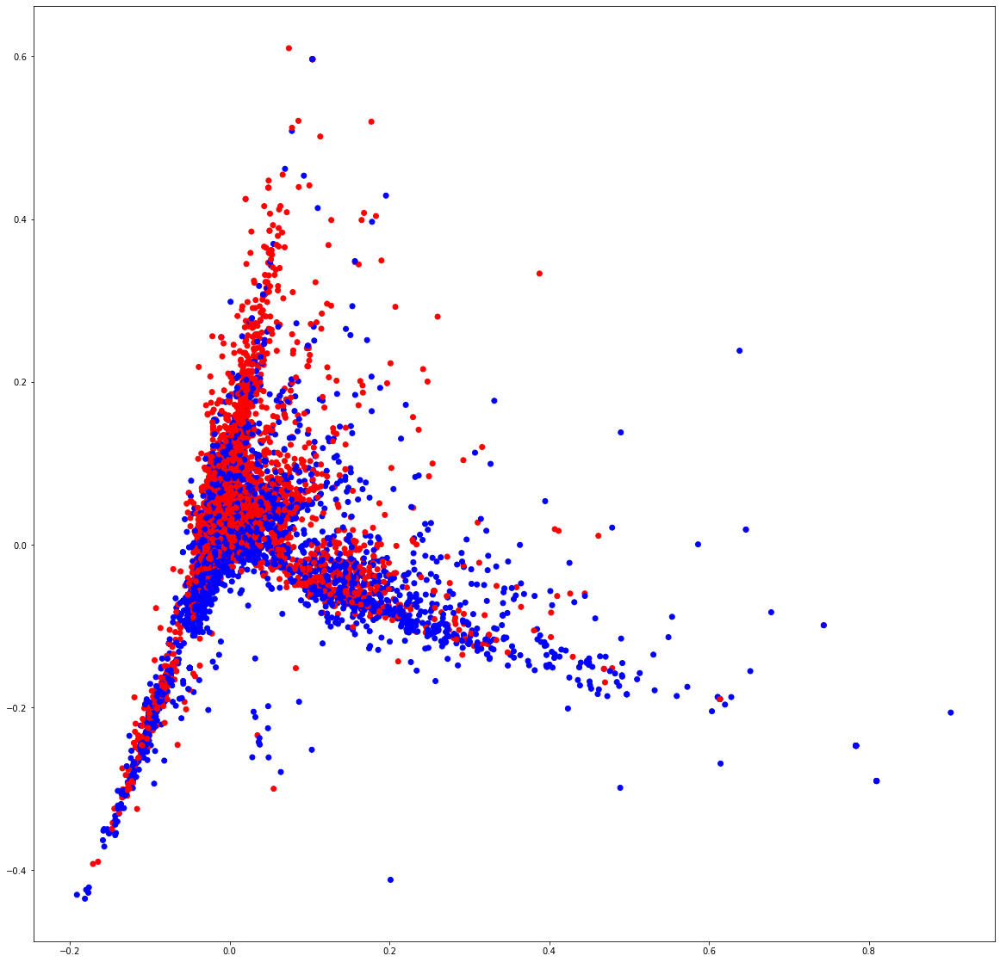

In [41]:

from sklearn.feature_extraction.text import CountVectorizer, TfidfTransformer
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline
import matplotlib.pyplot as plt

labels_dict = {'Negative':'red', 'Neutral':'gray', 'Positive':'blue'}

def convert_labels(label):
    return labels_dict[label]

first_K_targets = shuffled_df.head(K).label.apply(lambda x: convert_labels(x))


pipeline = Pipeline([
    ('vect', CountVectorizer()),
    ('tfidf', TfidfTransformer()),
])        
X = pipeline.fit_transform(first_K_tweets).todense()

pca = PCA(n_components=2).fit(X)
data2D = pca.transform(X)
plt.figure(figsize = (20, 20))
plt.scatter(data2D[:,0], data2D[:,1], c=first_K_targets)
plt.show()

# Training

### CNN Model #1


In [42]:
from tensorflow.keras.layers import Conv1D, Bidirectional, LSTM, Dense, Input, Dropout
from tensorflow.keras.layers import SpatialDropout1D
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ReduceLROnPlateau

In [43]:
from keras.models import Model
from keras.layers import Input
from keras.layers import Dense
from keras.layers import Flatten
from keras.layers import Dropout
from keras.layers import Embedding
from keras.layers.convolutional import Conv1D
from keras.layers.convolutional import MaxPooling1D
from keras.layers.merge import concatenate
from keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau

In [44]:
sequence_input = Input(shape=(30,), dtype='int32')
embedding_sequences = embedding_layer(sequence_input)
x = SpatialDropout1D(0.2)(embedding_sequences)
x = Conv1D(64, 5, activation='relu')(x)
x = Dense(512, activation='relu')(x)
x = Dropout(0.5)(x)
x = Dense(512, activation='relu')(x)
x = MaxPooling1D(pool_size=2)(x)
x = Flatten()(x)
outputs = Dense(1, activation='sigmoid')(x)
model = tf.keras.Model(sequence_input, outputs)


model.compile(optimizer=Adam(learning_rate=1e-3), loss='binary_crossentropy', metrics=['accuracy'])
ReduceLROnPlateau = ReduceLROnPlateau(factor=0.1, min_lr = 0.01, monitor = 'val_loss', verbose = 1)

print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

Num GPUs Available:  0


In [45]:
history = model.fit(X_train, y_train, batch_size=1024, epochs=10, validation_data=(X_test, y_test), callbacks=[ReduceLROnPlateau])

Epoch 1/10
1245/1245 [==============================] - 897s 721ms/step - loss: 0.5181 - accuracy: 0.7408 - val_loss: 0.5016 - val_accuracy: 0.7541
Epoch 2/10
1245/1245 [==============================] - 775s 623ms/step - loss: 0.4897 - accuracy: 0.7625 - val_loss: 0.4815 - val_accuracy: 0.7702
Epoch 3/10
1245/1245 [==============================] - 865s 695ms/step - loss: 0.4793 - accuracy: 0.7694 - val_loss: 0.4739 - val_accuracy: 0.7746
Epoch 4/10
1245/1245 [==============================] - 865s 694ms/step - loss: 0.4737 - accuracy: 0.7731 - val_loss: 0.4704 - val_accuracy: 0.7752
Epoch 5/10
1245/1245 [==============================] - 842s 676ms/step - loss: 0.4696 - accuracy: 0.7752 - val_loss: 0.4733 - val_accuracy: 0.7752
Epoch 6/10
1245/1245 [==============================] - 753s 605ms/step - loss: 0.4664 - accuracy: 0.7773 - val_loss: 0.4693 - val_accuracy: 0.7780
Epoch 7/10
1245/1245 [==============================] - 750s 603ms/step - loss: 0.4643 - accuracy: 0.7789 - val_

In [46]:
model.save('models/cnn_model.h5')

In [46]:
import numpy as np
import re
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.preprocessing import LabelEncoder

from tensorflow.keras.layers import Conv1D, Bidirectional, LSTM, Dense, Input, Dropout
from tensorflow.keras.layers import SpatialDropout1D
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ReduceLROnPlateau
import tensorflow as tf

In [46]:
load_model = tf.keras.models.load_model('../models/cnn_model.h5')

# Check its architecture
load_model.summary()

Model: "functional_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 30)]              0         
_________________________________________________________________
embedding (Embedding)        (None, 30, 300)           87137400  
_________________________________________________________________
spatial_dropout1d (SpatialDr (None, 30, 300)           0         
_________________________________________________________________
conv1d (Conv1D)              (None, 26, 64)            96064     
_________________________________________________________________
dense (Dense)                (None, 26, 512)           33280     
_________________________________________________________________
dropout (Dropout)            (None, 26, 512)           0         
_________________________________________________________________
dense_1 (Dense)              (None, 26, 512)          

Text(0.5, 0, 'epoch')

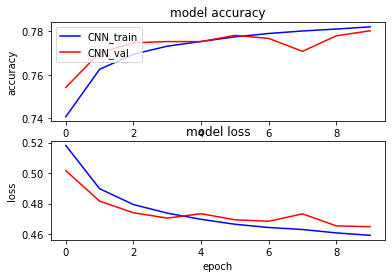

In [51]:
plt1, (plt2, plt3) = plt.subplots(2,1)
plt2.plot(history.history['accuracy'], c= 'blue')
plt2.plot(history.history['val_accuracy'], c='red')
plt2.set_title('model accuracy')
plt2.set_ylabel('accuracy')
plt2.set_xlabel('epoch')
plt2.legend(['CNN_train', 'CNN_val'], loc='upper left')

plt3.plot(history.history['loss'], c='blue')
plt3.plot(history.history['val_loss'], c='red')
plt3.set_title('model loss')
plt3.set_ylabel('loss')
plt3.set_xlabel('epoch')

In [52]:
def decode_labels(score):
    return "Positive" if score > 0.5 else "Negative"


scores = model.predict(X_test, verbose=1, batch_size=10000)
y_pred = [decode_labels(score) for score in scores]

32/32 [==============================] - 44s 1s/step


#### Confusion Matrix

[[124059  35434]
 [ 34587 124386]]


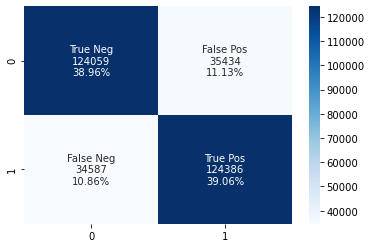

In [53]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
import seaborn as sns

#Get the confusion matrix
cf_matrix = confusion_matrix(test_data.label.to_list(), y_pred)
print(cf_matrix)


#sns.heatmap(cf_matrix, annot=True)
#sns.heatmap(cf_matrix/np.sum(cf_matrix), annot=True, fmt='.2%', cmap='Blues')
labels = ['True Neg','False Pos','False Neg','True Pos']
labels = np.asarray(labels).reshape(2,2)
#sns.heatmap(cf_matrix, annot=labels, fmt='', cmap='Blues')
group_names = ['True Neg','False Pos','False Neg','True Pos']
group_counts = ["{0:0.0f}".format(value) for value in
                cf_matrix.flatten()]
group_percentages = ["{0:.2%}".format(value) for value in
                     cf_matrix.flatten()/np.sum(cf_matrix)]
labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in
          zip(group_names,group_counts,group_percentages)]
labels = np.asarray(labels).reshape(2,2)
sns.heatmap(cf_matrix, annot=labels, fmt='', cmap='Blues')

In [54]:
print(classification_report(list(test_data.label), y_pred))

              precision    recall  f1-score   support

    Negative       0.78      0.78      0.78    159493
    Positive       0.78      0.78      0.78    158973

    accuracy                           0.78    318466
   macro avg       0.78      0.78      0.78    318466
weighted avg       0.78      0.78      0.78    318466



### CNN Model #2


In [47]:
sequence_input = Input(shape=(30,), dtype='int32')
embedding_sequences = embedding_layer(sequence_input)
x = SpatialDropout1D(0.2)(embedding_sequences)
x = Conv1D(32, 5, activation='relu')(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.5)(x)
x = Dense(256, activation='relu')(x)
x = MaxPooling1D(pool_size=2)(x)
x = Flatten()(x)
outputs = Dense(1, activation='sigmoid')(x)
model2 = tf.keras.Model(sequence_input, outputs)


model2.compile(optimizer=Adam(learning_rate=1e-3), loss='binary_crossentropy', metrics=['accuracy'])
ReduceLROnPlateau = ReduceLROnPlateau(factor=0.1, min_lr = 0.01, monitor = 'val_loss', verbose = 1)

print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

Num GPUs Available:  0


In [48]:
history2 = model2.fit(X_train, y_train, batch_size=512, epochs=10, validation_data=(X_test, y_test), callbacks=[ReduceLROnPlateau])

Epoch 1/10
2489/2489 [==============================] - 460s 185ms/step - loss: 0.5215 - accuracy: 0.7389 - val_loss: 0.4899 - val_accuracy: 0.7637
Epoch 2/10
2489/2489 [==============================] - 422s 170ms/step - loss: 0.4952 - accuracy: 0.7593 - val_loss: 0.4939 - val_accuracy: 0.7639
Epoch 3/10
2489/2489 [==============================] - 431s 173ms/step - loss: 0.4883 - accuracy: 0.7639 - val_loss: 0.4880 - val_accuracy: 0.7661
Epoch 4/10
2489/2489 [==============================] - 462s 186ms/step - loss: 0.4843 - accuracy: 0.7663 - val_loss: 0.4816 - val_accuracy: 0.7725
Epoch 5/10
2489/2489 [==============================] - 422s 170ms/step - loss: 0.4820 - accuracy: 0.7677 - val_loss: 0.4816 - val_accuracy: 0.7729
Epoch 6/10
2489/2489 [==============================] - 432s 174ms/step - loss: 0.4800 - accuracy: 0.7693 - val_loss: 0.4793 - val_accuracy: 0.7713
Epoch 7/10
2489/2489 [==============================] - 354s 142ms/step - loss: 0.4783 - accuracy: 0.7702 - val_

In [51]:
model2.save('../models/cnn_model2.h5')

In [62]:
load_model2 = tf.keras.models.load_model('../models/cnn_model2.h5')

# Check its architecture
load_model2.summary()

Model: "functional_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 30)]              0         
_________________________________________________________________
embedding (Embedding)        (None, 30, 300)           87137400  
_________________________________________________________________
spatial_dropout1d (SpatialDr (None, 30, 300)           0         
_________________________________________________________________
conv1d (Conv1D)              (None, 26, 32)            48032     
_________________________________________________________________
dense (Dense)                (None, 26, 256)           8448      
_________________________________________________________________
dropout (Dropout)            (None, 26, 256)           0         
_________________________________________________________________
dense_1 (Dense)              (None, 26, 256)          

Text(0.5, 0, 'epoch')

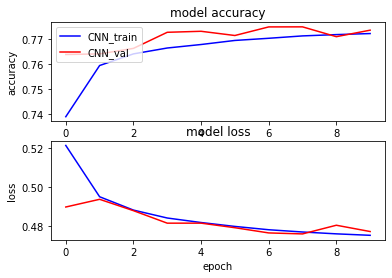

In [57]:
plt1, (plt2, plt3) = plt.subplots(2,1)
plt2.plot(history2.history['accuracy'], c= 'blue')
plt2.plot(history2.history['val_accuracy'], c='red')
plt2.set_title('model accuracy')
plt2.set_ylabel('accuracy')
plt2.set_xlabel('epoch')
plt2.legend(['CNN_train', 'CNN_val'], loc='upper left')

plt3.plot(history2.history['loss'], c='blue')
plt3.plot(history2.history['val_loss'], c='red')
plt3.set_title('model loss')
plt3.set_ylabel('loss')
plt3.set_xlabel('epoch')

In [59]:
def decode_labels(score):
    return "Positive" if score > 0.5 else "Negative"


scores = model2.predict(X_test, verbose=1, batch_size=10000)
y_pred = [decode_labels(score) for score in scores]

32/32 [==============================] - 20s 632ms/step


#### Confusion Matrix

[[115824  43669]
 [ 28499 130474]]


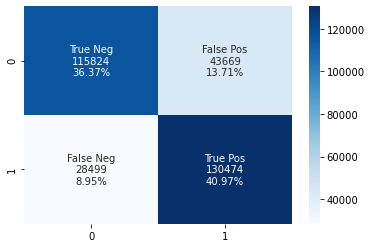

In [60]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
import seaborn as sns

#Get the confusion matrix
cf_matrix = confusion_matrix(test_data.label.to_list(), y_pred)
print(cf_matrix)


#sns.heatmap(cf_matrix, annot=True)
#sns.heatmap(cf_matrix/np.sum(cf_matrix), annot=True, fmt='.2%', cmap='Blues')
labels = ['True Neg','False Pos','False Neg','True Pos']
labels = np.asarray(labels).reshape(2,2)
#sns.heatmap(cf_matrix, annot=labels, fmt='', cmap='Blues')
group_names = ['True Neg','False Pos','False Neg','True Pos']
group_counts = ["{0:0.0f}".format(value) for value in
                cf_matrix.flatten()]
group_percentages = ["{0:.2%}".format(value) for value in
                     cf_matrix.flatten()/np.sum(cf_matrix)]
labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in
          zip(group_names,group_counts,group_percentages)]
labels = np.asarray(labels).reshape(2,2)
sns.heatmap(cf_matrix, annot=labels, fmt='', cmap='Blues')

In [61]:
print(classification_report(list(test_data.label), y_pred))

              precision    recall  f1-score   support

    Negative       0.80      0.73      0.76    159493
    Positive       0.75      0.82      0.78    158973

    accuracy                           0.77    318466
   macro avg       0.78      0.77      0.77    318466
weighted avg       0.78      0.77      0.77    318466



In [63]:
from sklearn.metrics import roc_curve
y_pred_cnn1 = load_model.predict(X_test).ravel()
fpr_cnn1, tpr_cnn1, thresholds_cnn1 = roc_curve(y_test, y_pred_cnn1)
y_pred_cnn2 = load_model2.predict(X_test).ravel()
fpr_cnn2, tpr_cnn2, thresholds_cnn2 = roc_curve(y_test, y_pred_cnn2)

In [64]:
#AUC calculation
from sklearn.metrics import auc
auc_cnn1 = auc(fpr_cnn1, tpr_cnn1)
auc_cnn2 = auc(fpr_cnn2, tpr_cnn2)

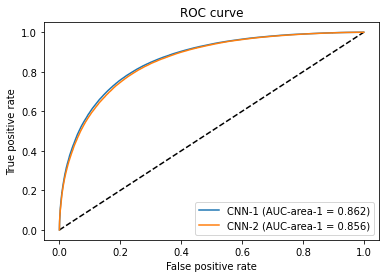

In [66]:
plt.figure(1)
plt.plot([0, 1], [0, 1], 'k--')
plt.plot(fpr_cnn1, tpr_cnn1, label='CNN-1 (AUC-area-1 = {:.3f})'.format(auc_cnn1))
plt.plot(fpr_cnn2, tpr_cnn2, label='CNN-2 (AUC-area-1 = {:.3f})'.format(auc_cnn2))
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('ROC curve')
plt.legend(loc='best')
plt.show()

### Entropy and Information Gain

In [69]:
from scipy.stats import entropy
from math import log, e
def entropy(labels, base=None):
    """ Computes entropy of label distribution. """

    n_labels = len(labels)

    if n_labels <= 1:
        return 0

    value,counts = np.unique(labels, return_counts=True)
    probs = counts / n_labels
    n_classes = np.count_nonzero(probs)

    if n_classes <= 1:
        return 0

    ent = 0.

    # Compute entropy
    base = e if base is None else base
    for i in probs:
        ent -= i * log(i, base)

    return ent

In [70]:
ent_df = entropy(df)

In [71]:
ent_df

14.73368002815221

In [80]:
df_f = pd.read_csv('../data/training.1600000.processed.noemoticon.csv', header=None, encoding='latin')
df_f.columns = ['label', 'id', 'date', 'query', 'user', 'tweet']

In [76]:
# Data reduction
df_f =  df_f.drop(['id'], axis=1)

In [81]:
labels_dict = {0:'Negative', 2:'Neutral', 4:'Positive'}

def convert_labels(label):
    return labels_dict[label]

df_f.label = df_f.label.apply(lambda x: convert_labels(x))

In [85]:
ent_df_first = entropy(df_f)
ent_df_first

41.08269441306875